In [1]:
import pylab as plt
import matplotlib.pyplot as plt
import numpy as np
import h5py
import shutil
import pdb
import datetime
import os
from operator import truediv
import operator
from scipy.optimize import curve_fit
import matplotlib.cm as cm
from scipy.optimize import leastsq

%pylab
%matplotlib inline
%load_ext autoreload
%autoreload 2


Using matplotlib backend: Qt4Agg
Populating the interactive namespace from numpy and matplotlib


In [2]:
corr_list = [4,11,17,22,27,28,29]
freq_phase = np.linspace(400,800,1024)
colors=['r','g','b','k','c','y','m']
legend_crosscorr = ["(0,4) A63","(1,4) A00","(2,4) A48","(3,4) A31","(5,4) B00","(6,4) B63","(7,4) B48"]

freq=462
num =14

In [3]:
def mag(tot_frames,corr_files):
        tot_magnitude = np.zeros((tot_frames, len(corr_list), len(freq_phase[50:990])))
        tot_magnitude_ref = np.zeros((tot_frames, 2, len(freq_phase[50:990])))
        x=0
        for corr_file in corr_files:
                for i in range(len(corr_list)):
                        frames =  corr_file['vis'][:].shape[0]
                        tot_magnitude[x:x+frames,i,:] = (np.sqrt(corr_file['vis'][:][:,corr_list[i],50:990]['imag'].astype(np.float)**2 + corr_file['vis'][:][:,corr_list[i],50:990]['real'].astype(np.float)**2))
                tot_magnitude_ref[x:x+frames,0,:] = np.sqrt(corr_file['vis'][:][:,26,50:990]['imag'].astype(np.float)**2 + corr_file['vis'][:][:,27,50:990]['real'].astype(np.float)**2)
                tot_magnitude_ref[x:x+frames,1,:] = corr_file['vis'][:][:,27,50:990]
                x = x + frames

        return tot_magnitude,tot_magnitude_ref

In [4]:
def gain_freq(corr_files,tot_frames,visibility, visibility_ref):
        x=0
        gain_1 = np.zeros((tot_frames, len(corr_list), len(freq_phase[50:990])))
        for corr_file in corr_files:
                frames = corr_file['vis'][:].shape[0]
                gain = np.zeros((frames, len(corr_list), len(freq_phase[50:990])))
                for i in range(len(corr_list)):
                        gain_1[x:frames+x,i,:] = 20*np.log10(np.sqrt(corr_file['vis'][:][:,corr_list[i],50:990]['imag'].astype(np.float)**2 + corr_file['vis'][:][:,corr_list[i],50:990]['real'].astype(np.float)**2)/(np.sqrt(corr_file['vis'][:][:,26,50:990]['imag'].astype(np.float)**2 + corr_file['vis'][:][:,26,50:990]['real'].astype(np.float)**2)))
                x=frames+x

        return gain_1[:,:,::-1]

In [5]:
def delay_unwrap(tot_frames,corr_files):
        delay = np.zeros((tot_frames,len(corr_list)))
        #phi = np.zeros((frames, len(corr_list), len(freq_phase[20:990])))# not taking some frequency bins
        kk=0
        delay_freq_bad_frame = np.zeros((len(corr_list),len(freq_phase[50:990])))
        for corr_file in corr_files:
                vis = corr_file['vis'][:][:,corr_list,50:990]
                frames = corr_file['vis'][:].shape[0]
                vis_abs =  np.sqrt((vis['imag']).astype(np.float)**2+(vis['real']).astype(np.float)**2)
                vis_abs =  np.sqrt((vis['imag']).astype(np.float)**2+(vis['real']).astype(np.float)**2)
                phi = np.arctan2((vis['imag']),(vis['real']))
                unwrap_phase_1 = np.unwrap(phi)
                unwrap_phase = unwrap_phase_1[:,::-1]/(2*np.pi)
                slope = [[0 for x in range(len(corr_list))] for y in range(frames)]
                for j in range(len(corr_list)):
                        slope_1 = []
                        for i in range(frames):
                                slope[i],b = np.polyfit(freq_phase[50:990]*10**6,unwrap_phase[i][j][:],1)
                                if slope[i]<0:
                                        slope[i] = slope[i]*(-1.0)
                        delay[kk:kk+frames,j] = slope
                kk=kk+frames
                #pdb.set_trace()
        return np.array(delay),unwrap_phase #

In [6]:
def get_timestamp(tot_frames,corr_files):
        cpu_cycle = np.zeros(tot_frames)
        x = 0
        for corr_file in corr_files:
                frame = corr_file['vis'][:].shape[0]
                timestamp = corr_file['timestamp']
                cpu_cycle[x:x+frame] = [time[1] for time in timestamp]
                x=x+frame
        return cpu_cycle


In [7]:
def data(chan):
        number_of_frame = corr_file['vis'][:].shape[0]
        print('Number of frames:' + str(number_of_frame))
        return number_of_frame

In [8]:
para=3
def quadratic(x,*p):
        freq_reqd = freq
        return p[0]*x**2 + p[1]*x+  p[2]

In [9]:
def sinusoidal(x,*p):
        freq_reqd = freq
        return p[0]*x + p[1]*(np.cos(2*np.pi*p[2]))#+ np.cos(2*np.pi*4/(0.84*3*10**2/freq_reqd)))

In [10]:
source_dir = ['C:/Users/sidhant/Desktop/data/20170407T194716Z_stone_corr/', 'C:/Users/sidhant/Desktop/data/20170410T180753Z_stone_corr/','C:/Users/sidhant/Desktop/data/20170414T020912Z_stone_corr/' ,'C:/Users/sidhant/Desktop/data/20170430T010748Z_stone_corr_one_file_deleted/', 'C:/Users/sidhant/Desktop/data/20170519T221539Z_stone_corr/' ,'C:/Users/sidhant/Desktop/data/20170525T174006Z_stone_corr_two_files_delated/'] #Apr 7-apr 10, #Apr 10-APR 13 #Apr 29 - May14
tot_frames = 0
corr_files=[]
for d in range(len(source_dir)):
    source_directory = source_dir[d]
    source_name = os.path.realpath(source_directory).split('/')[-1]
    active_dir = source_dir[d]
    all_file_names = os.listdir(active_dir)
    data_file_names = []
    for file_name in all_file_names:
        if ('.lock' not in file_name) and ('.h5' in file_name):
                data_file_names.append(file_name)
    data_file_names.sort()
    for file_name in data_file_names:
        corr_files.append(h5py.File(active_dir+file_name,'r'))

for corr_file in corr_files:
    frames = data(corr_list)
    tot_frames = tot_frames + frames
    

print(corr_files)
visibility, visibility_ref = mag(tot_frames,corr_files)
delay, unwrap_phase = delay_unwrap(tot_frames,corr_files)
# the return gain is in db/logrithmic
gain_all_db = gain_freq(corr_files,tot_frames,visibility, visibility_ref)
gain_all = 10**(gain_all_db/20)

time_stamp = get_timestamp(tot_frames,corr_files)
#date_stamp = [datetime.datetime.fromtimestamp(time) + datetime.timedelta(hours = -7) for time in time_stamp]
date_stamp = [datetime.datetime.fromtimestamp(time)  for time in time_stamp]

Number of frames:360
Number of frames:61
Number of frames:360
Number of frames:119
Number of frames:360
Number of frames:360
Number of frames:360
Number of frames:264
Number of frames:360
Number of frames:360
Number of frames:54
Number of frames:360
[<HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00216004_0000.h5" (mode r)>, <HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00216003_0000.h5" (mode r)>, <HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00648000_0000.h5" (mode r)>, <HDF5 file "00863999_0000.h5" (mode r)>, <HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00216003_0000.h5" (mode r)>, <HDF5 file "00432001_0000.h5" (mode r)>, <HDF5 file "00216003_0000.h5" (mode r)>]


In [11]:
file = open("temp_data_all.out","r")
date_temp = np.loadtxt('temp_data_all.out')
file.close()

date_weather_data_new = date_temp[0]
temp_weather_data_new = date_temp[1]

temp_frame = [718,120,718,236,718,718,718,526,50,718,106,718]

a= date_weather_data_new[0:718]
b= temp_weather_data_new[0:718]
temp_1 = np.append(a[::2],a[717])
time_1 = np.append(b[::2],b[717])

a= date_weather_data_new[718:838]
b= temp_weather_data_new[718:838]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[119])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[119])

a= date_weather_data_new[838:1556]
b= temp_weather_data_new[838:1556]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[717])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[717])

a= date_weather_data_new[1556:1792]
b= temp_weather_data_new[1556:1792]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[235])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[235])

a= date_weather_data_new[1792:2510]
b= temp_weather_data_new[1792:2510]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[717])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[717])

a= date_weather_data_new[2510:3228]
b= temp_weather_data_new[2510:3228]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[717])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[717])

a= date_weather_data_new[3228:3946]
b= temp_weather_data_new[3228:3946]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[717])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[717])

a= date_weather_data_new[3946:4472]
print(len(a))
b= temp_weather_data_new[3946:4472]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[525])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[525])


time_partial_new = np.array([(datetime.datetime.fromtimestamp(x))  for x in temp_1 ])
#time_partial_new = np.array([(datetime.datetime.fromtimestamp(x)) for x in temp_1 ])

# these are the times that we are using from here!
temp_intercept_model = time_1[42::]
time_intercept_model = time_partial_new[42::]

526


In [12]:
freq_selected = freq_phase[50:990]

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\ipykernel\__main__.py:28: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


only one
only one
only one
only one
only one
only one
only one


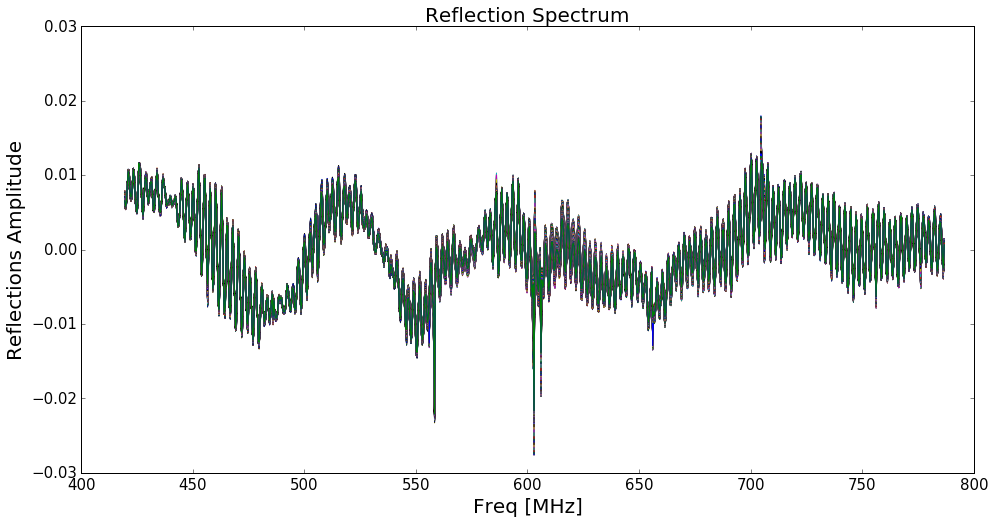

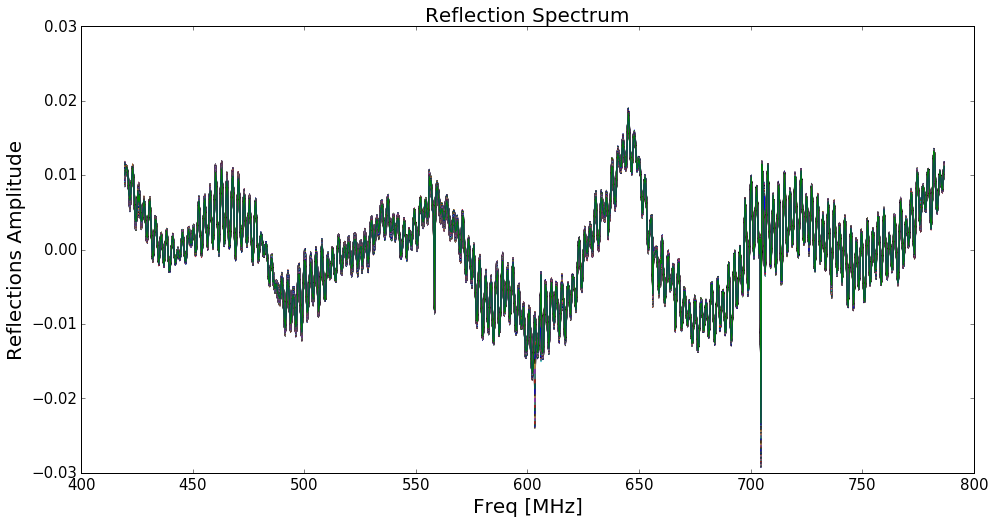

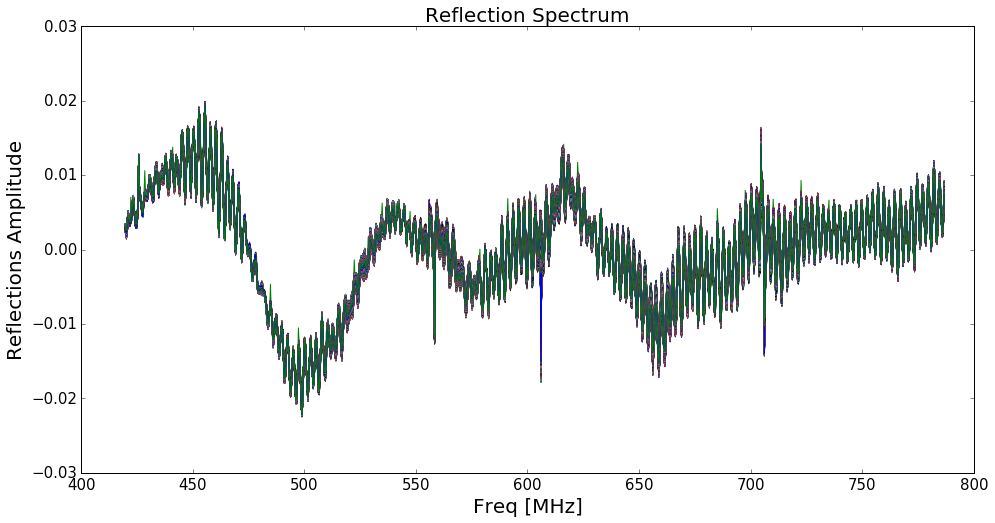

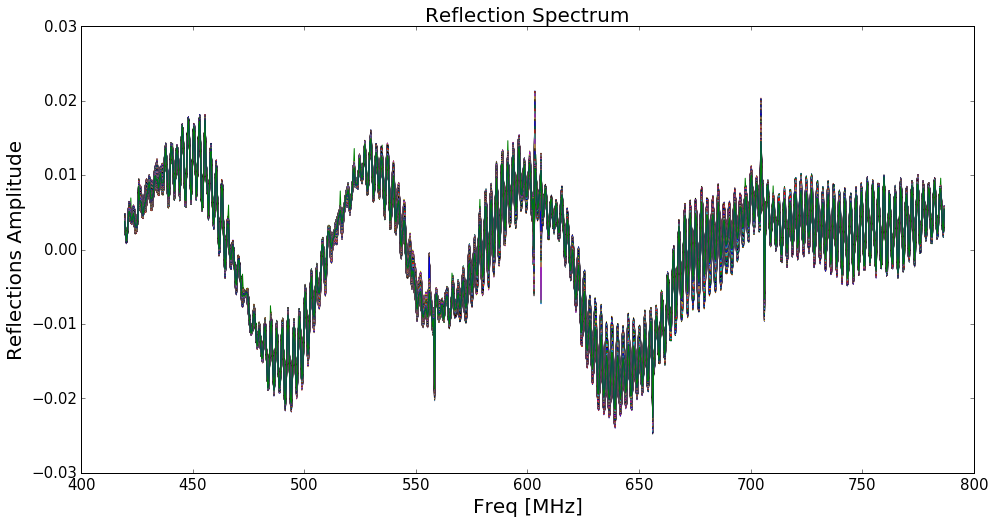

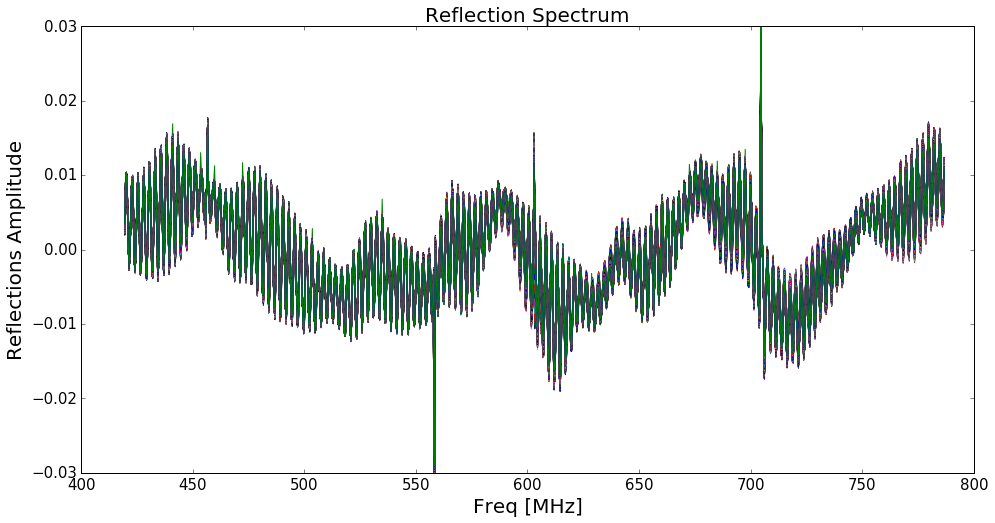

...

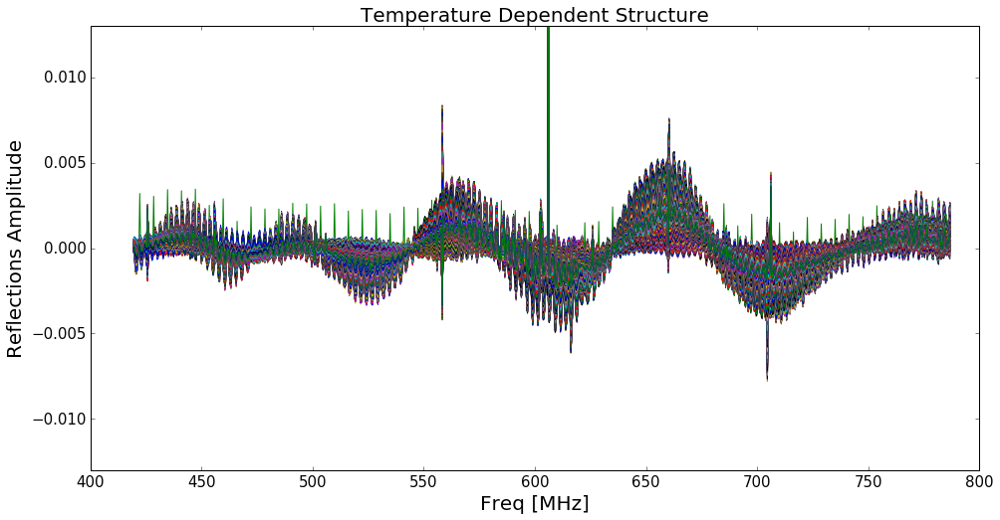

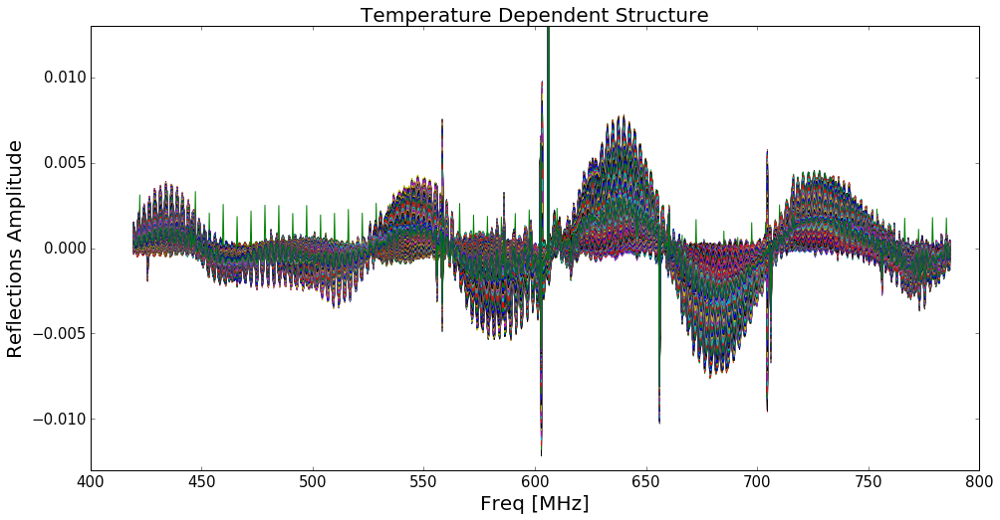

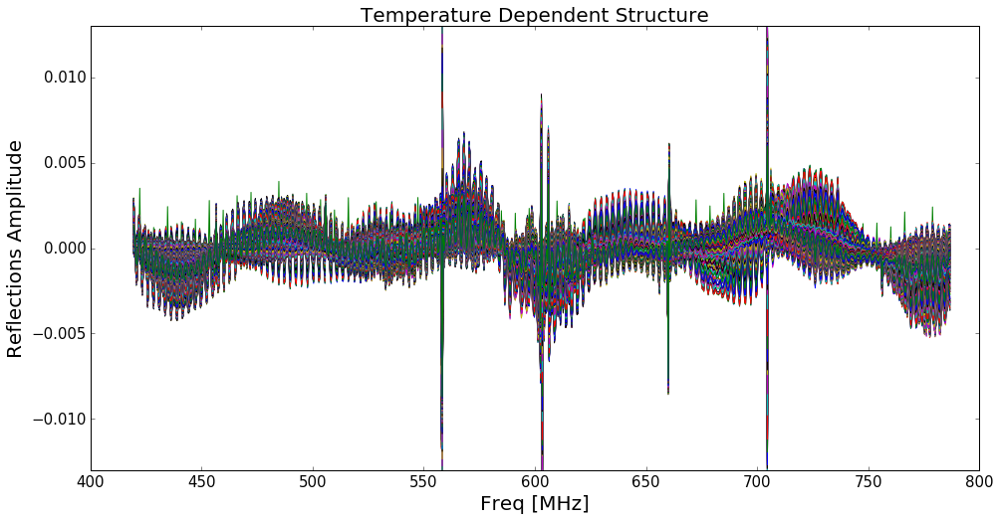

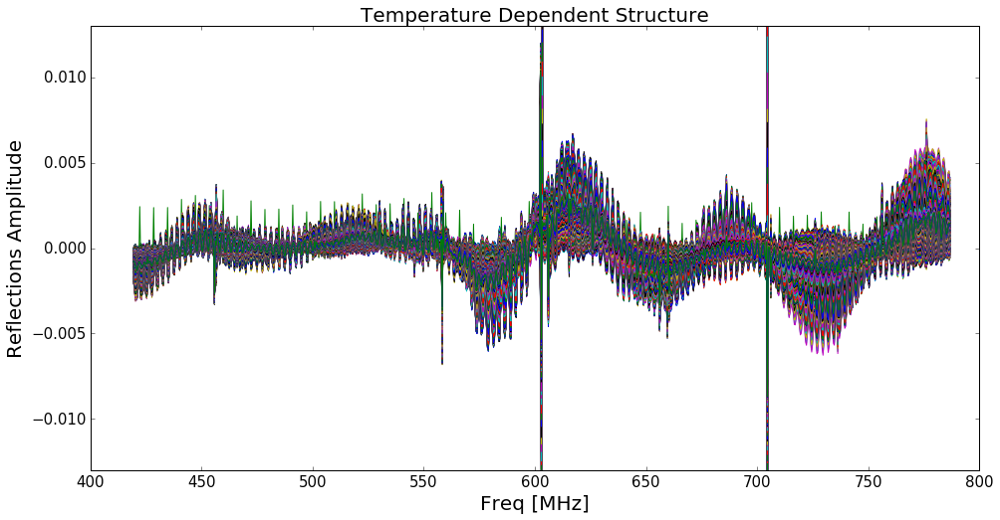

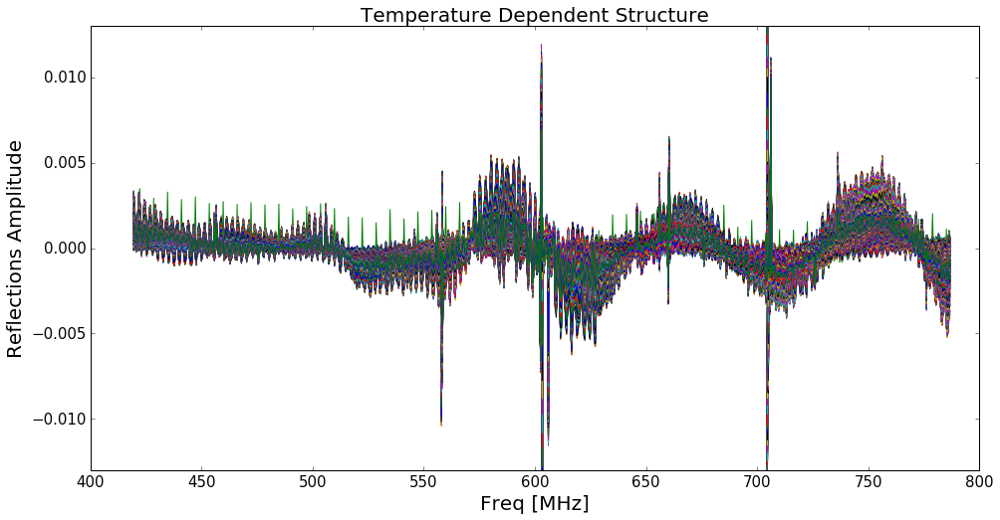

In [13]:
# Analyzing one cable and multiple time frames 

k=0
figure(figsize(16,8))
frame_numbers = np.linspace(0,800, num=800)

val_single_freq_bin1 = np.zeros(len(frame_numbers))
val_single_freq_bin2 = np.zeros(len(frame_numbers))
val_single_freq_bin3 = np.zeros(len(frame_numbers))
val_single_freq_bin4 = np.zeros(len(frame_numbers))

val_all_freq = []
val_all_freq_pre = np.zeros((len(frame_numbers),len(freq_phase[50:990])))
count=0
calc_avg = []

for i in range(len(corr_list)):
    val_all_freq.append([])

plt_count=0        
for kk in range(len(corr_list)):
    
    val_all_freq[kk] = np.zeros((len(frame_numbers),len(freq_phase[50:990])))
    plt_count = plt_count+1
      
    for i in range(len(frame_numbers)):
        
        gain_raw = gain_all[frame_numbers[i],kk,:] # for cable 2
        z=np.polyfit(freq_phase[50:990], gain_raw,1)
        p=np.poly1d(z)
        gain_line_sub = gain_raw - p(freq_phase[50:990])

        if i==0:
            print('only one')
            gain_line_sub_reference = gain_line_sub
            gain_reference = gain_raw
        
        plt.figure(plt_count)
        
        #plt.subplot(2,1,1)
        plt.plot(freq_phase[50:990], gain_line_sub )
        plt.ylim(-0.03,0.03)
        #plt.title('Reflections for cable number %s and multiple time frames' %(str(legend_crosscorr[kk])))
        #plt.ylabel('Raw Gain - Linear fit')
        plt.xlabel('Freq [MHz]', size=20)
        plt.title('Reflection Spectrum', size=20)
        plt.ylabel('Reflections Amplitude', size=20)
        plt.yticks( fontsize = 15)
        plt.xticks( fontsize = 15)
        
        
        plt.figure(plt_count+7)
        
        #plt.subplot(2,1,2)
        plt.plot(freq_phase[50:990],gain_line_sub- gain_line_sub_reference)
        plt.ylim(-0.013,0.013)
        plt.title('Temperature Dependent Structure', size=20)
        plt.ylabel('Reflections Amplitude', size=20)
        #plt.title('Subtracting Reflections of frame 1 from other frames for cable %s' %(str(legend_crosscorr[kk])),)
        #plt.ylabel('Difference in Reflections')
        plt.xlabel('Freq [MHz]', size=20)
        plt.yticks( fontsize = 15)
        plt.xticks( fontsize = 15)

        for k in range(len(freq_phase[50:990])):
            val_all_freq[kk][i][k] = gain_line_sub[k]- gain_line_sub_reference[k]
            val_all_freq_pre[i,k] = gain_line_sub[k]

        val_single_freq_bin1[i] = gain_line_sub[459]- gain_line_sub_reference[459]
        val_single_freq_bin2[i] = gain_line_sub[460]- gain_line_sub_reference[460]
        val_single_freq_bin3[i] = gain_line_sub[461]- gain_line_sub_reference[461]
        val_single_freq_bin4[i] = gain_line_sub[700]- gain_line_sub_reference[700]

0
(-0.00196887780836+0.000218208037616j)


C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\ipykernel\__main__.py:44: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


1
(-0.010829308846+9.19580326135e-05j)
2
(0.00157839760632+0.000219396525191j)
3
(0.00913875871753+0.000132740465225j)
4
(0.000501344970938-9.38052394444e-05j)
5
(-0.0063320931839+0.000235926635071j)
6
(-0.0124622225665+0.000109322853385j)


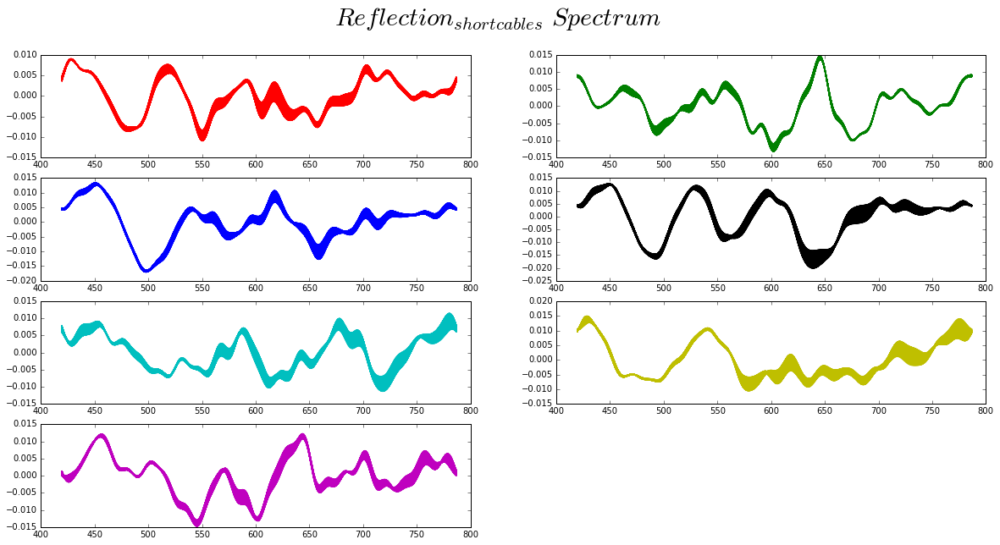

In [238]:
value_all_600 =[]
reflections_ref_val_600 = []
gain_all_line_sub=[]

for i in range(len(corr_list)):
    value_all_600.append([])
    reflections_ref_val_600.append([])

figure(figsize(20,10))    
plt.suptitle('$Reflection_{short cables}$ $Spectrum$', size=30)
plt.xlabel('Freq[MHz]', size=30)

for k in range(len(corr_list)):
    print(k)
    value_all_600[k] = np.zeros((800,len(freq_phase[50:990])))
    fft_reflections_ref=[]
    
    for ii in range(800):
        components=[]
        amplitude =[]
        z=np.polyfit(freq_phase[50:990], gain_all[ii,k,:],1)
        p=np.poly1d(z)
        gain_line_sub = gain_all[ii,k,:] - p(freq_phase[50:990])
        gain_all_line_sub.append(gain_line_sub)

        ifft_component = (np.fft.ifft(gain_line_sub))  
        ifft_component0 = (np.fft.ifft(gain_line_sub) )
        end = len(ifft_component)
      
        for i in range(end):
            if (i<21) or (i>917):
                components.append(i)
                amplitude.append(np.abs(ifft_component[i]))
        
        for i in range(len(ifft_component)):
            if i not in components: 
                ifft_component0[i] = 0
        
        fft_reflections = np.fft.fft(ifft_component0) 
        if ii==0:
            fft_reflections_ref = fft_reflections
        
        for kk in range(len(freq_phase[50:990])):
            value_all_600[k][ii][kk] = (fft_reflections[kk]) - (fft_reflections_ref[kk])
            if kk == freq:
                reflections_ref_val_600[k] = fft_reflections_ref[kk]
                if ii==10:
                    print(fft_reflections_ref[kk])
        
        plt.subplot(4,2,k+1)
        plt.plot(freq_phase[50:990],(fft_reflections), color=colors[k])
        

0
(-0.00208681582598-1.90214175267e-05j)


C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\ipykernel\__main__.py:43: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


1
(-0.000323878013173-0.000164721184454j)
2
(-0.00271468726238-0.000139345728436j)
3
(-0.00179270282551-0.000179749422682j)
4
(0.00299298268482+0.000161900986368j)
5
(-0.00472576041789-0.00032090724454j)
6
(-0.00130968647537-0.000176007572071j)


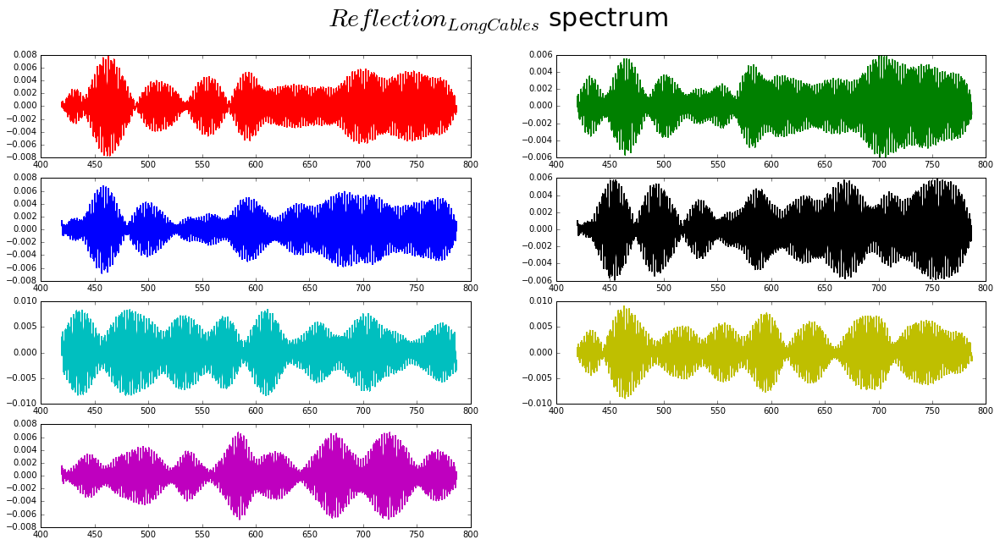

In [219]:
value_all_long_600 =[]
reflections_ref_long_val_600 = []

for i in range(len(corr_list)):
    value_all_long_600.append([])
    reflections_ref_long_val_600.append([])

figure(figsize(20,10))    
plt.suptitle('$Reflection_{Long Cables}$ spectrum', size=30)
plt.xlabel('Freq[MHz]', size=30)
for k in range(len(corr_list)):
    print(k)
    value_all_long_600[k] = np.zeros((800,len(freq_phase[50:990])))
    
    fft_reflections_ref=[]
    
    for ii in range(800):
        components=[]
        amplitude =[]
        z=np.polyfit(freq_phase[50:990], gain_all[ii,k,:],1)
        p=np.poly1d(z)
        gain_line_sub = gain_all[ii,k,:] - p(freq_phase[50:990])
        gain_all_line_sub.append(gain_line_sub)

        ifft_component = np.fft.ifft(gain_line_sub)  
        ifft_component0 = np.fft.ifft(gain_line_sub) 
        end = len(ifft_component)
      
        for i in range(end):
            if (i>134 and i<154) or (i>780 and i<810):
                components.append(i)
                amplitude.append(np.abs(ifft_component[i]))
        
        for i in range(len(ifft_component)):
            if i not in components: 
                ifft_component0[i] = 0
        
        fft_reflections = np.fft.fft(ifft_component0) 
        if ii==0:
            fft_reflections_ref = fft_reflections
        
        for kk in range(len(freq_phase[50:990])):
            value_all_long_600[k][ii][kk] = (fft_reflections[kk]) - (fft_reflections_ref[kk])
            if kk == freq:
                reflections_ref_long_val_600[k] = fft_reflections_ref[kk]
                if ii==10:
                    print(fft_reflections_ref[kk])
    
        #plt.figure(k+1)
        plt.subplot(4,2,k+1)
        plt.plot(freq_phase[50:990],fft_reflections, color=colors[k])

In [33]:
import scipy.optimize as optimization
from scipy.optimize import curve_fit
def func(T,a,b,c):
    return a*(T/b) + c

# modeling linear part

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\matplotlib\axes\_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


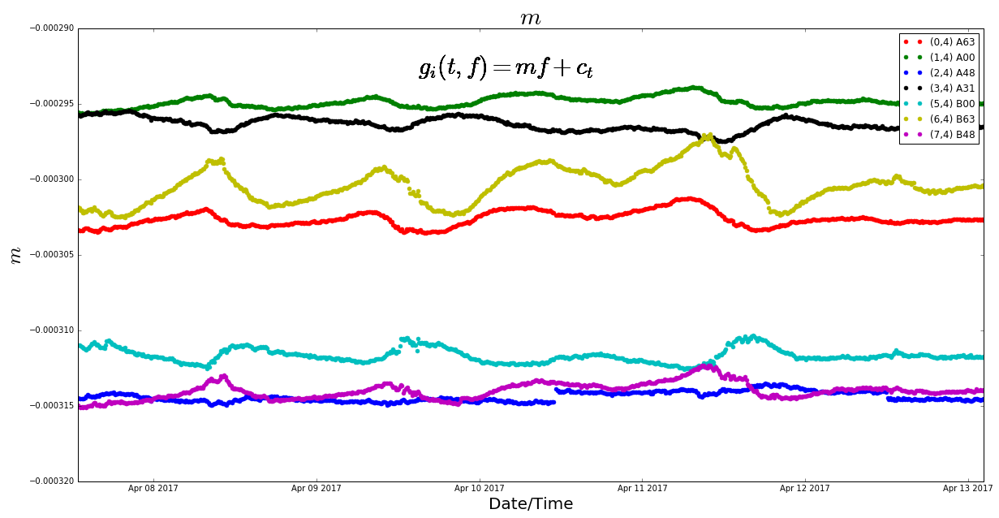

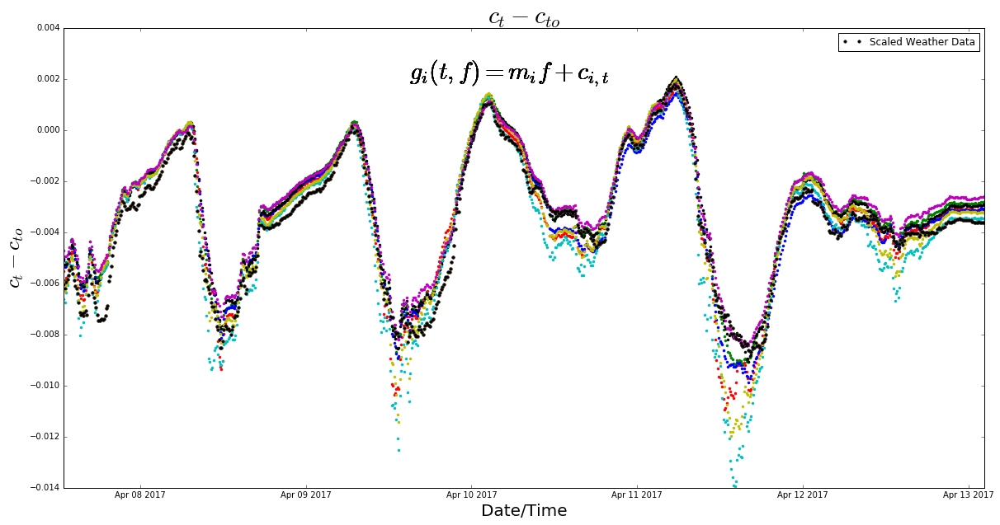

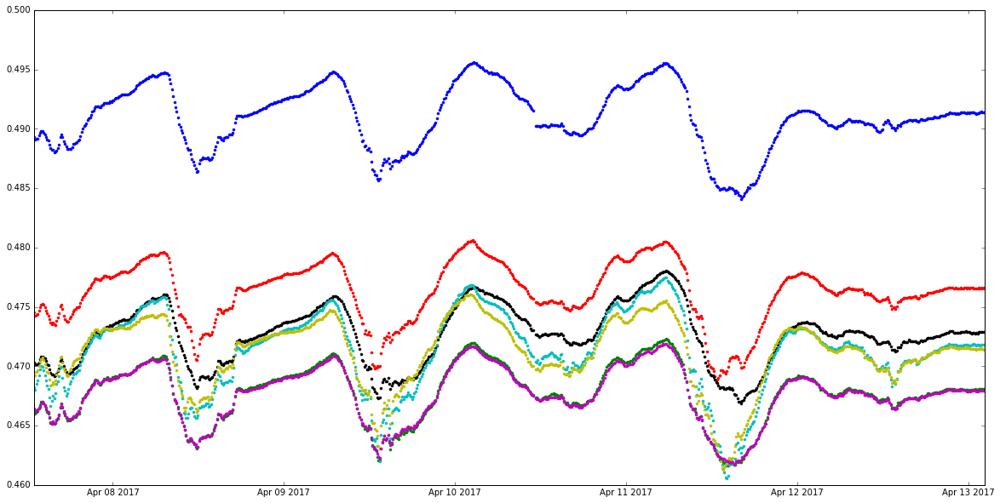

In [19]:
size=800 

for i in range(len(corr_list)):
    
    slope_all =np.zeros(len(gain_all[0:size,1,freq]))
    slope_all_wo_ref =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all_wo_ref =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all =np.zeros(len(gain_all[0:size,1,freq]))
    
    for j in range(size):
        slope,intercept=np.polyfit(freq_phase[50:990]-freq_phase[freq], gain_all[j,i,:],1)
        slope_all[j] = slope
        intercept_all[j] = intercept
        slope,intercept=np.polyfit(freq_phase[50:990], gain_all[j,i,:],1)
        slope_all_wo_ref[j] = slope
        intercept_all_wo_ref[j] = intercept
        
    
    plt.figure(1)
    plt.title(r'$m$ ', size=30)
    plt.text(date_stamp[300], -0.000293, r'$g_i(t,f) = m f+c_t $ ' , fontsize=30)
    plt.ylabel(r'$m$ ', size=25)
    plt.xlabel('Date/Time', size=20)
    plt.plot(date_stamp[0:800],slope_all, '.', markersize =10, color=colors[i], label = legend_crosscorr[i])
    plt.legend()
    
    plt.figure(2)
    if i==1: 
        plt.plot(date_stamp[0:800],-(temp_intercept_model[0:size]+235)/1400 +0.235-0.019-0.0205-0.015-0.013,'.k',markersize=7, label ='Scaled Weather Data')
    plt.title('$c_t - c_{to}$', size=30)
    plt.text(date_stamp[300], 0.002, r'$g_i(t,f) = m_i f+c_{i,t} $ ' , fontsize=30)
    plt.plot(date_stamp[0:800],intercept_all-intercept_all[100], '.', color=colors[i])
    plt.plot(date_stamp[0:800],-(temp_intercept_model[0:size]+235)/1400 +0.235-0.019-0.0205-0.015-0.013,'.')
    plt.xlabel('Date/Time', size=20)
    plt.ylabel('$c_t - c_{to}$', size=25)
    plt.legend()

    plt.figure(3)
    plt.plot(date_stamp[0:800],intercept_all_wo_ref, '.', color=colors[i])

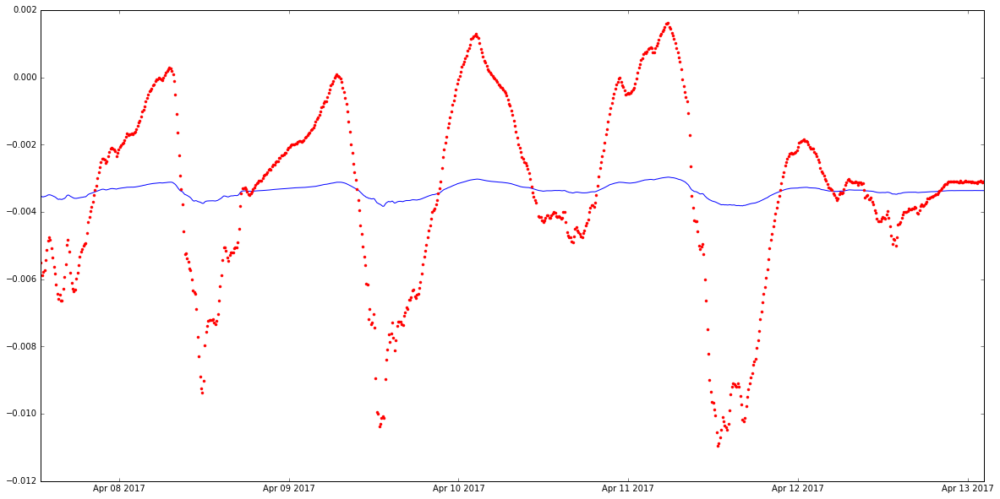

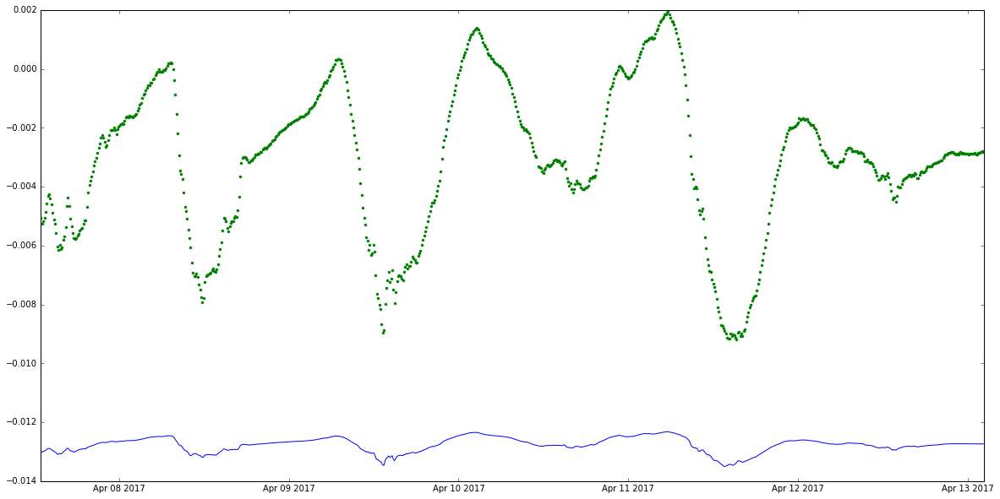

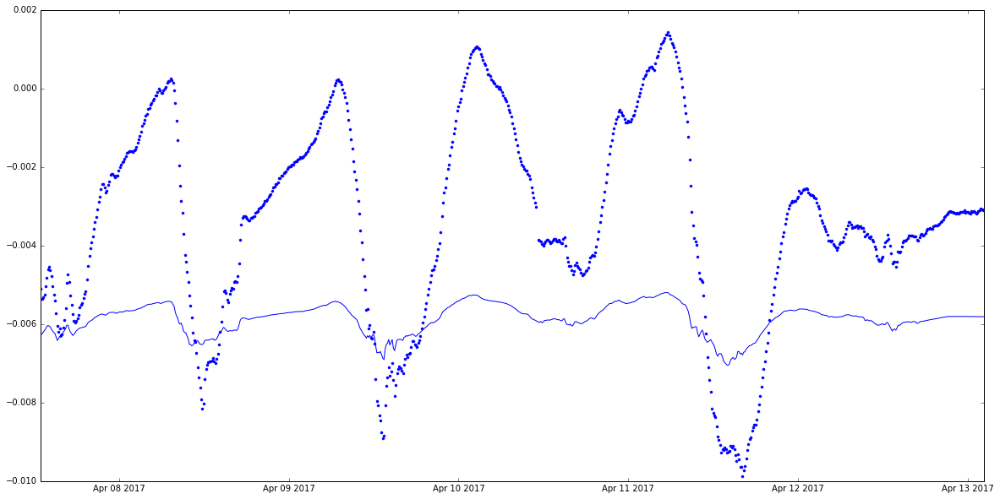

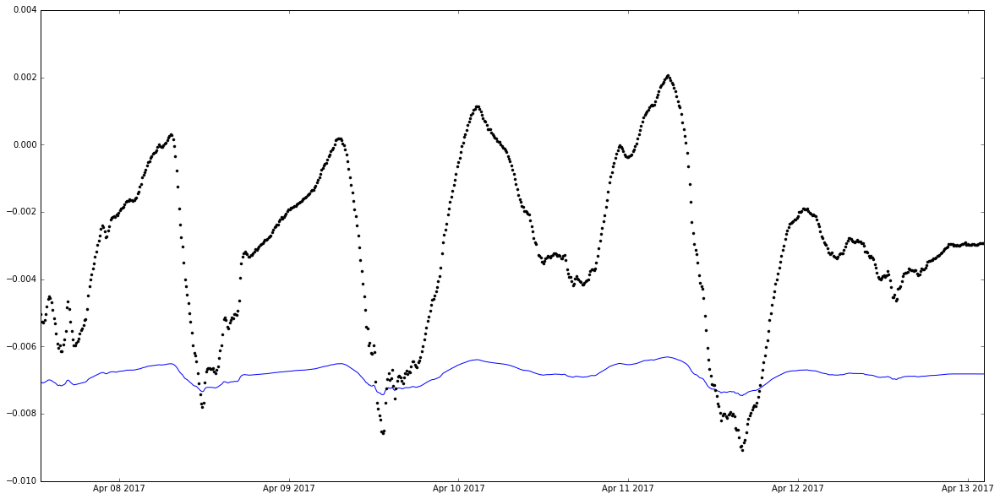

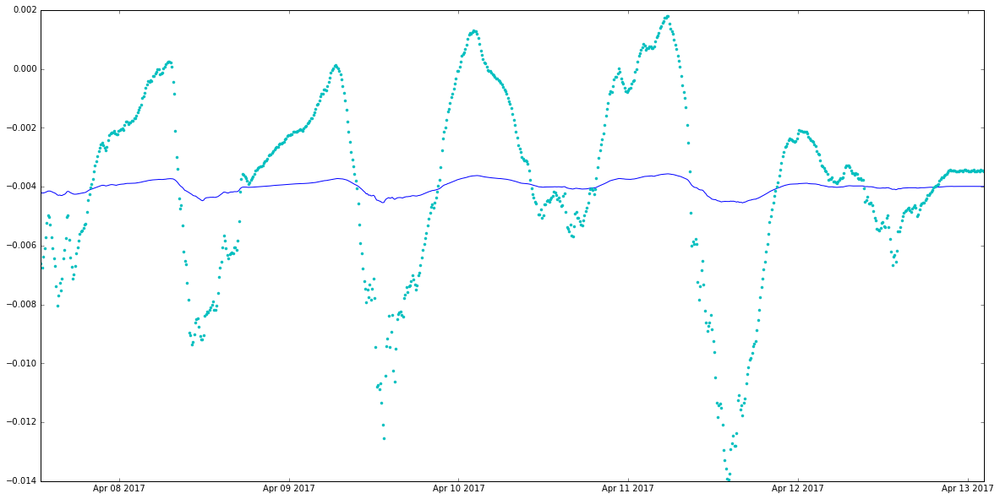

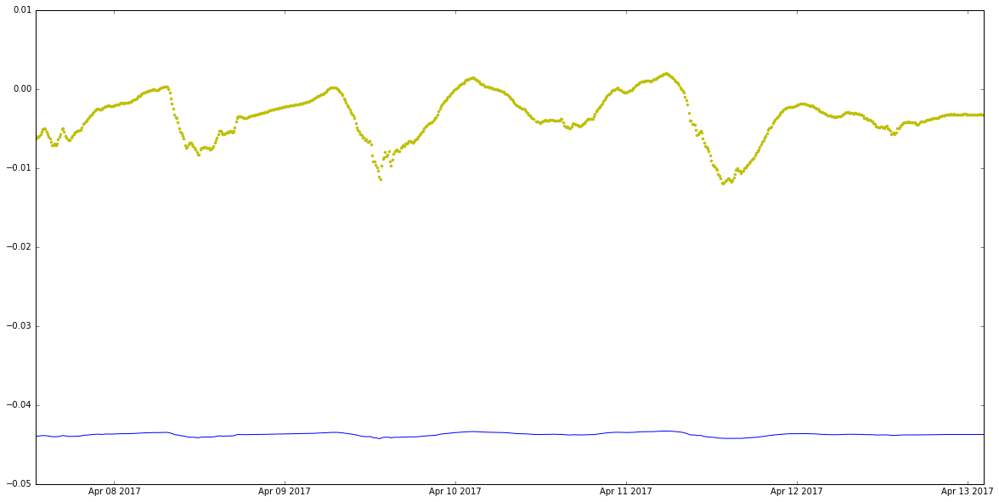

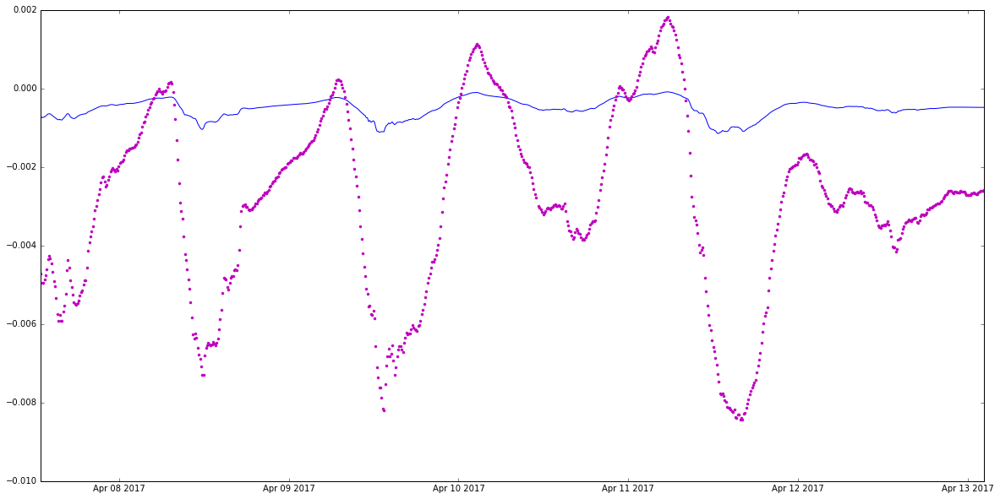

In [70]:
size=800 

for i in range(len(corr_list)):
    
    slope_all =np.zeros(len(gain_all[0:size,1,freq]))
    slope_all_wo_ref =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all_wo_ref =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all =np.zeros(len(gain_all[0:size,1,freq]))
    
    for j in range(size):
        slope,intercept=np.polyfit(freq_phase[50:990]-freq_phase[freq], gain_all[j,i,:],1)
        slope_all[j] = slope
        intercept_all[j] = intercept
        slope,intercept=np.polyfit(freq_phase[50:990], gain_all[j,i,:],1)
        slope_all_wo_ref[j] = slope
        intercept_all_wo_ref[j] = intercept

    plt.figure(1+i)
    #plt.plot(date_stamp[0:800],intercept_all_wo_ref, '.', color=colors[i])
    plt.plot(date_stamp[0:800],delay[0:800,i]*10**7-3.924)
    plt.plot(date_stamp[0:800],intercept_all-intercept_all[100], '.', color=colors[i])

In [73]:
import scipy.optimize as optimization
from scipy.optimize import curve_fit
def func_del(T,a,b):
    return a*T + b

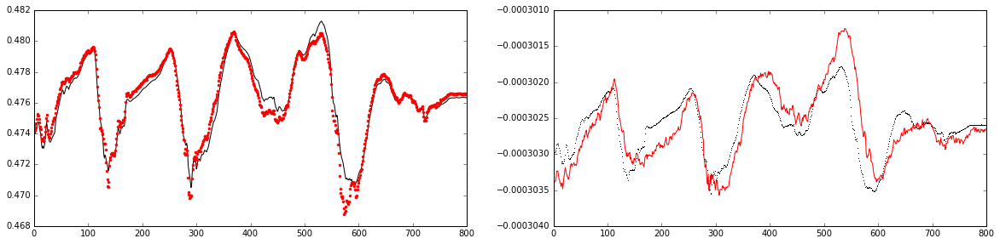

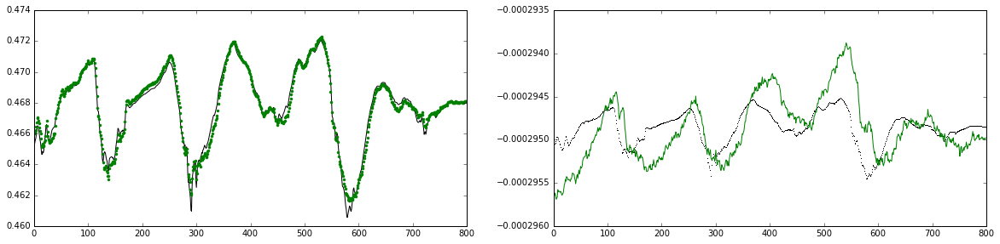

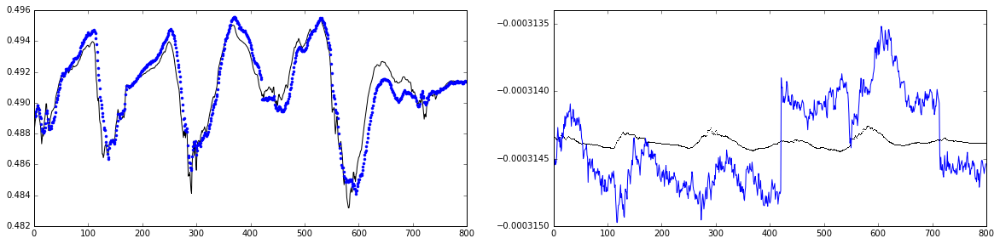

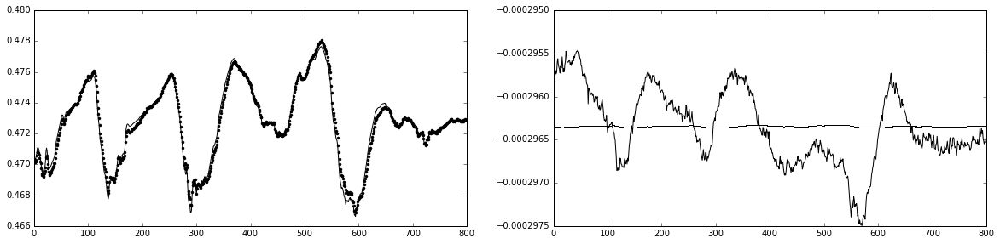

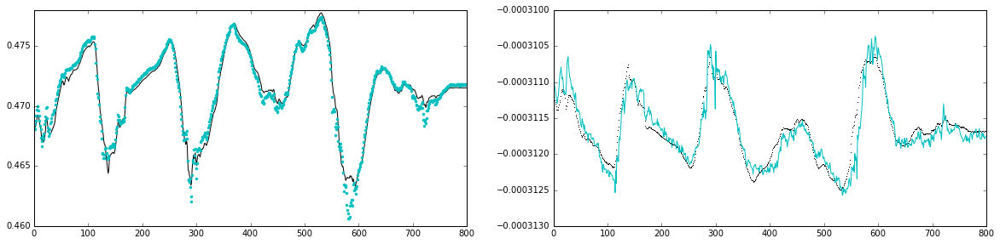

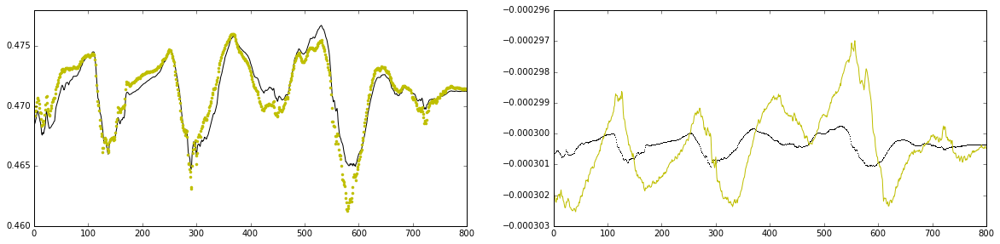

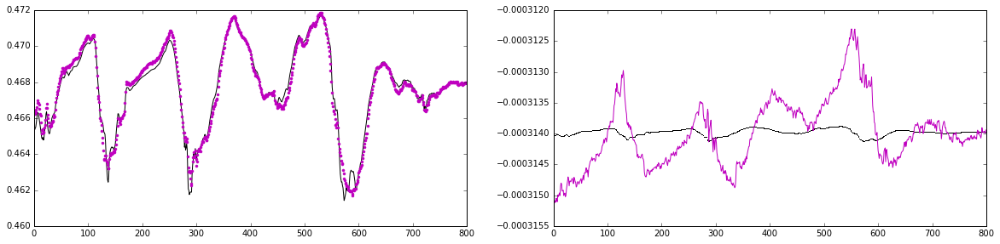

In [94]:
size=800 
slope_parameters=[]
intercept_parameters=[]
slope_all_wo_ref=[]
intercept_all_wo_ref=[]

for i in range(len(corr_list)):
    slope_parameters.append([])
    intercept_parameters.append([])
    slope_all_wo_ref.append([])
    intercept_all_wo_ref.append([])
    
for i in range(len(corr_list)):
    slope_all_wo_ref[i] =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all_wo_ref[i] =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all =np.zeros(len(gain_all[0:size,1,freq]))
    
    for j in range(size):
        slope,intercept=np.polyfit(freq_phase[50:990], gain_all[j,i,:],1)
        slope_all_wo_ref[i][j] = slope
        intercept_all_wo_ref[i][j] = intercept
    
    #intercept_required = 
    x0 = [10**7,-3.924]
    best_vals, covar = curve_fit(func_del, delay[0:800,i], intercept_all_wo_ref[i]  , p0 = x0)
    best_vals_slope, covar_slope = curve_fit(func_del, delay[0:800,i], slope_all_wo_ref[i], p0 = x0)
    intercept_parameters[i] = best_vals
    
    slope_parameters[i] =  best_vals_slope
    
    plt.figure(i+1)
    plt.subplot(2,2,1)
    plt.plot(func_del(delay[0:800,i],intercept_parameters[i][0], intercept_parameters[i][1]),'k')
    plt.plot(intercept_all_wo_ref[i] , '.', color=colors[i])
    
    plt.subplot(2,2,2)
    plt.plot(func_del(delay[0:800,i],slope_parameters[i][0], slope_parameters[i][1]),',k')
    plt.plot(slope_all_wo_ref[i], '-', color=colors[i])

In [92]:
freq_phase_model[freq]

600.19550342130992

In [96]:
freq_phase_model = freq_phase[50:990]

gain_linear_model_600=[]
gain_linear_raw_600=[]

for i in range(len(corr_list)):
    gain_linear_model_600.append([])
    gain_linear_raw_600.append([])
    
for i in range(len(corr_list)):
    gain_linear_model_600[i]= np.zeros(size)
    gain_linear_raw_600[i]= np.zeros(size)
    
    for k in range(size):
        gain_linear_model_600[i][k] = (func_del(delay[k,i],slope_parameters[i][0], slope_parameters[i][1]))*freq_phase_model[freq] + func_del(delay[k,i],intercept_parameters[i][0], intercept_parameters[i][1])
        gain_raw = gain_all[k,i,:]
        z=np.polyfit(freq_phase[50:990], gain_raw,1)
        p=np.poly1d(z)
        gain_raw_all = p(freq_phase[50:990])
        gain_linear_raw_600[i][k] = gain_raw_all[freq]

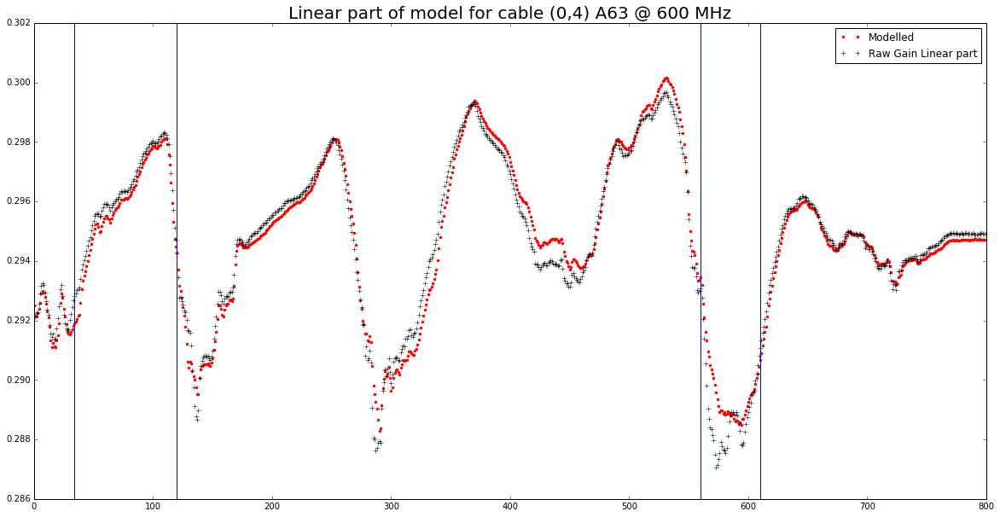

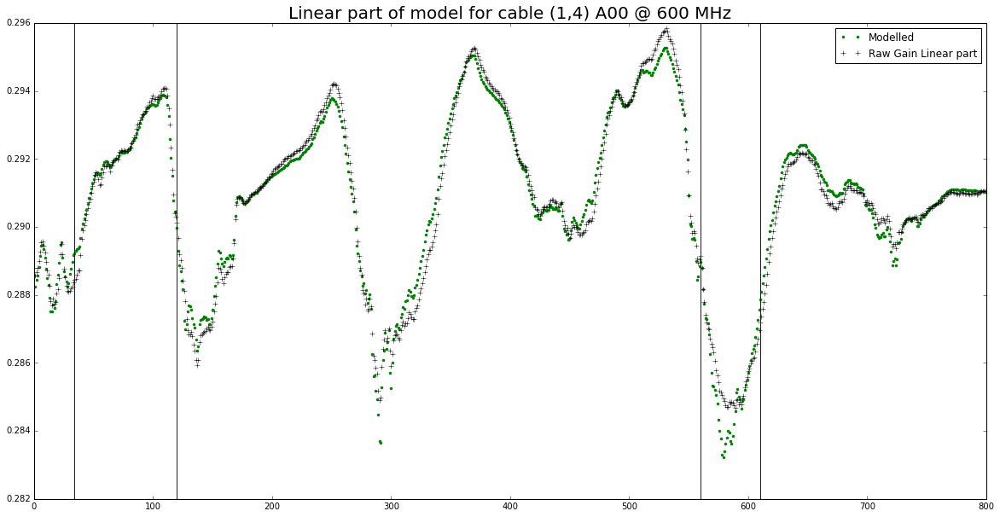

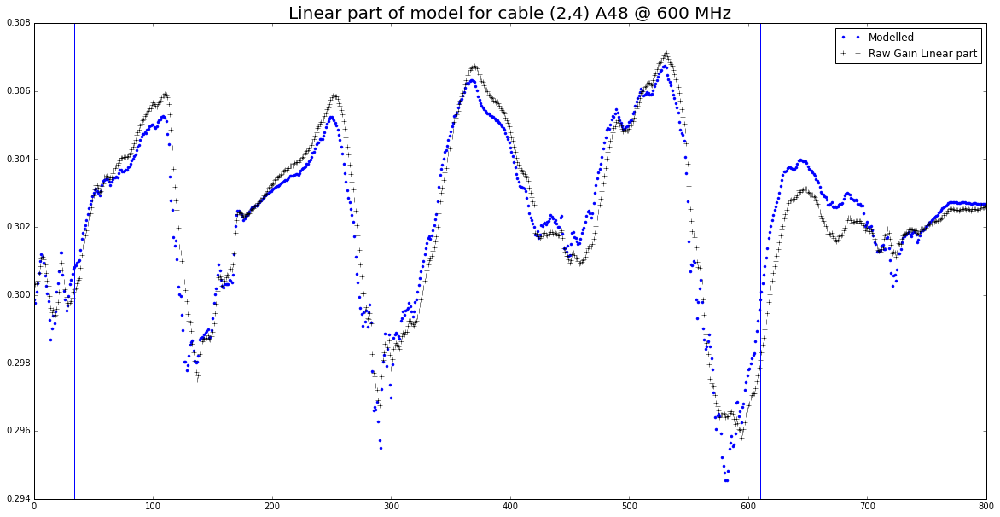

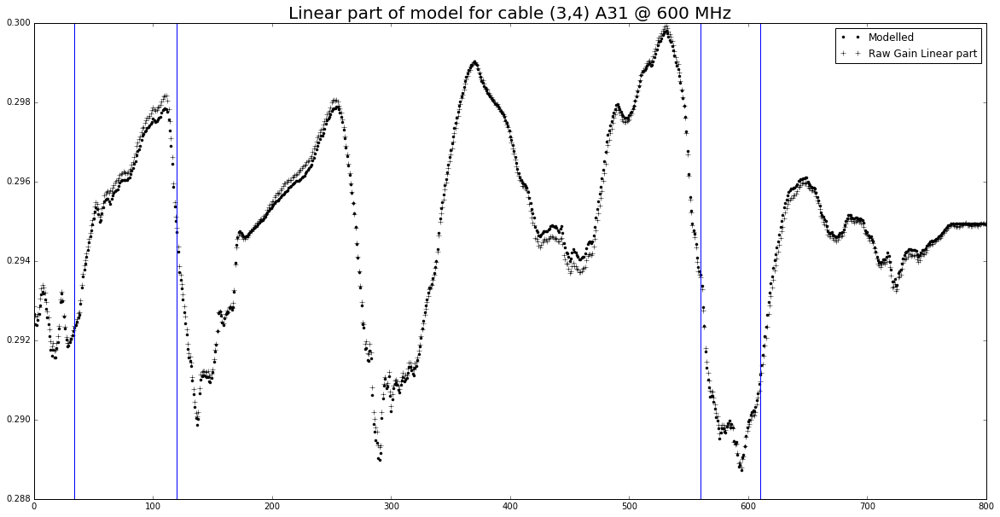

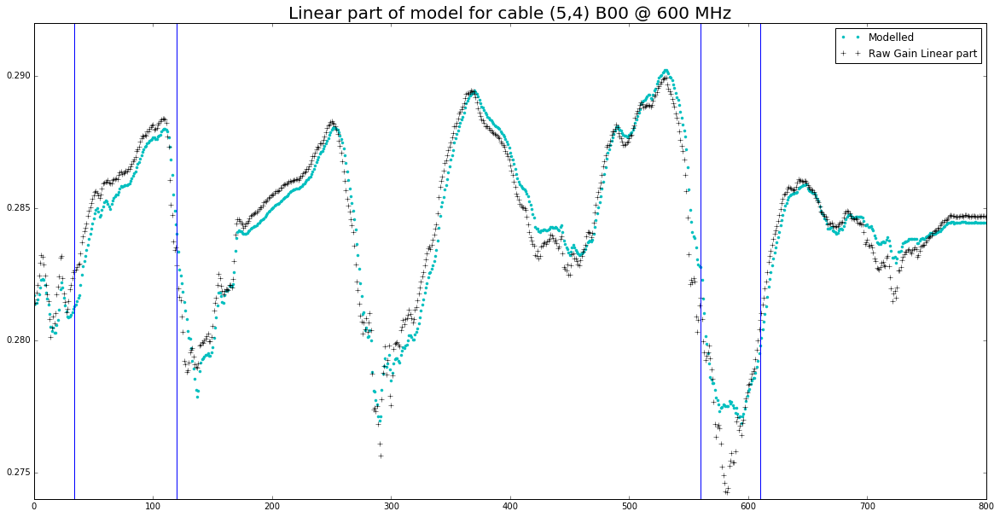

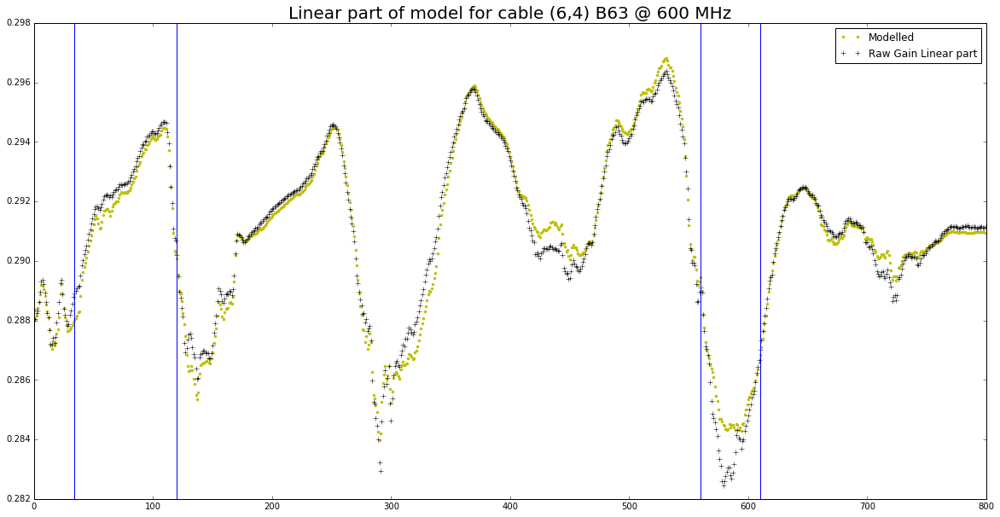

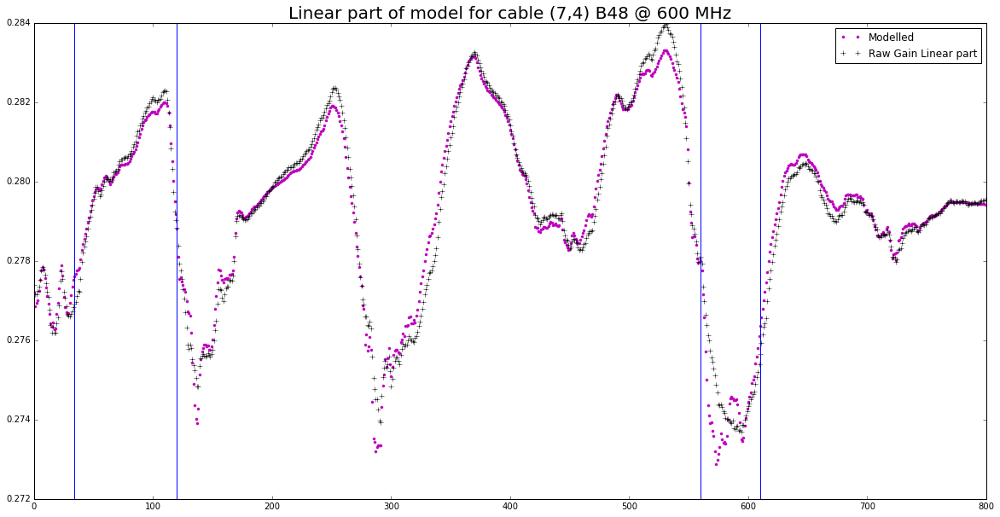

In [239]:
for i in range(len(corr_list)):
    plt.figure(i+1)
    plt.title('Linear part of model for cable %s @ 600 MHz' %(legend_crosscorr[i]), size=20)
    plt.plot(gain_linear_model_600[i], '.', color=colors[i], label='Modelled')
    plt.plot(gain_linear_raw_600[i], '+k', label='Raw Gain Linear part')
    plt.legend()
    plt.axvline(x=[580+30])
    plt.axvline(x=[580-20])
    plt.axvline(x=[120])
    plt.axvline(x=[34])

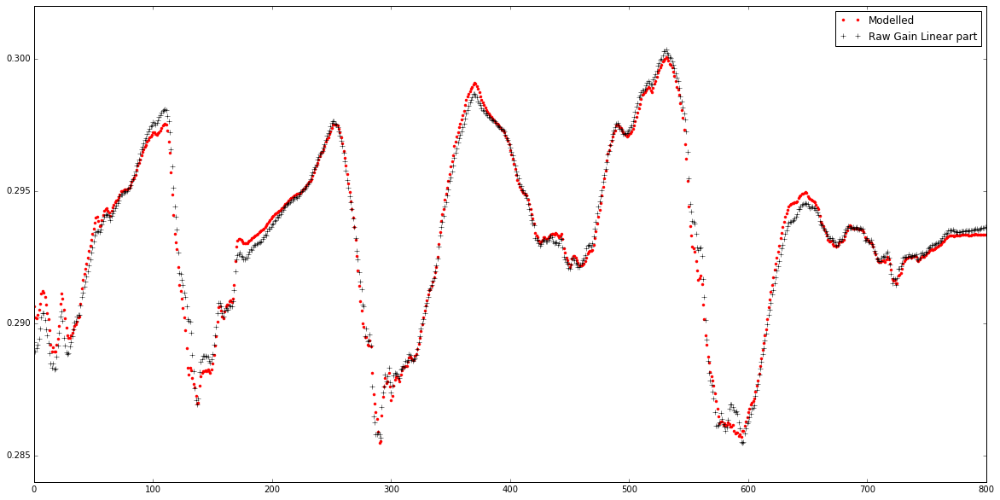

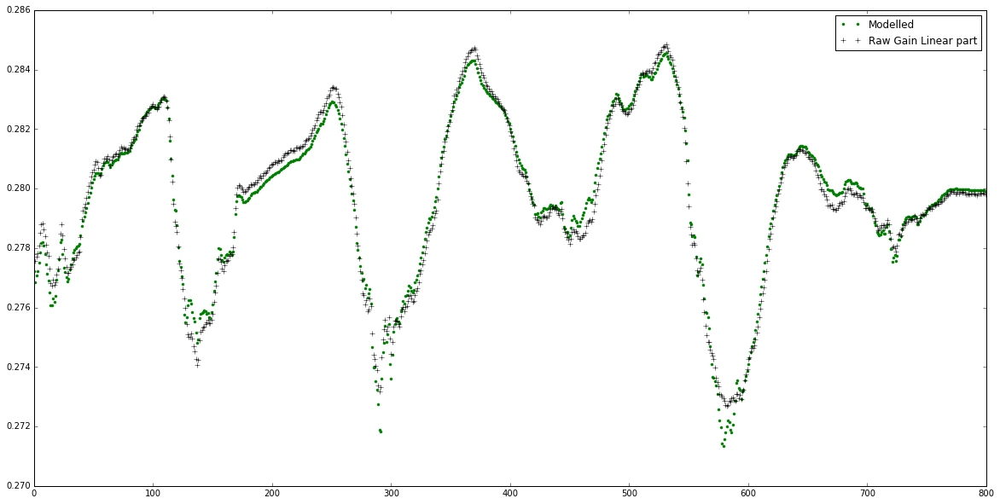

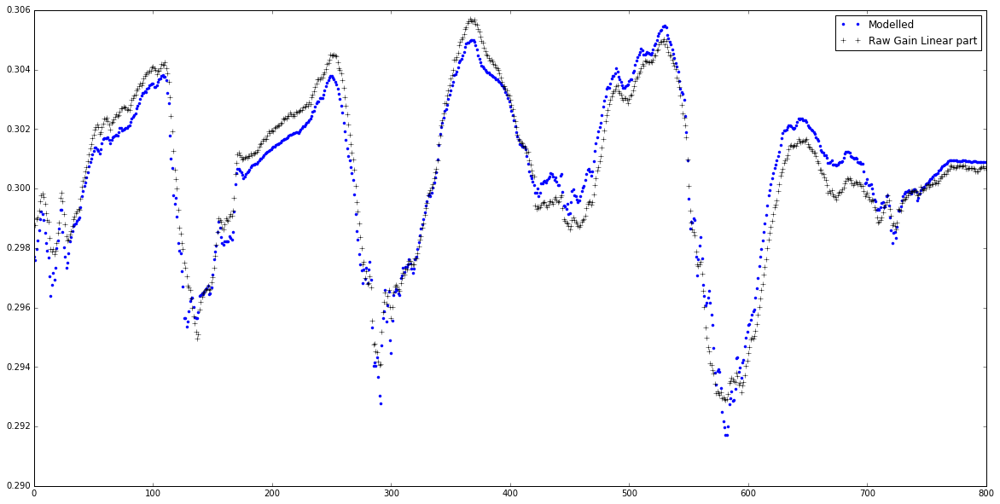

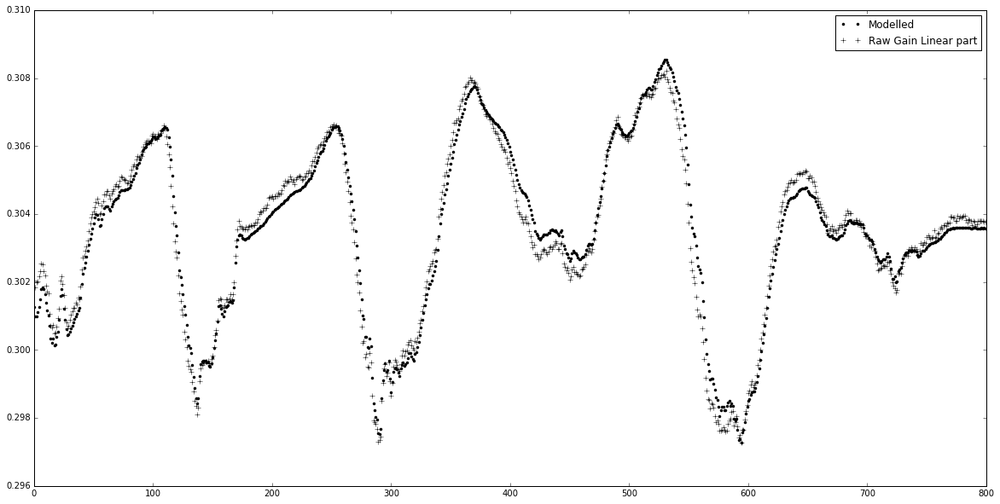

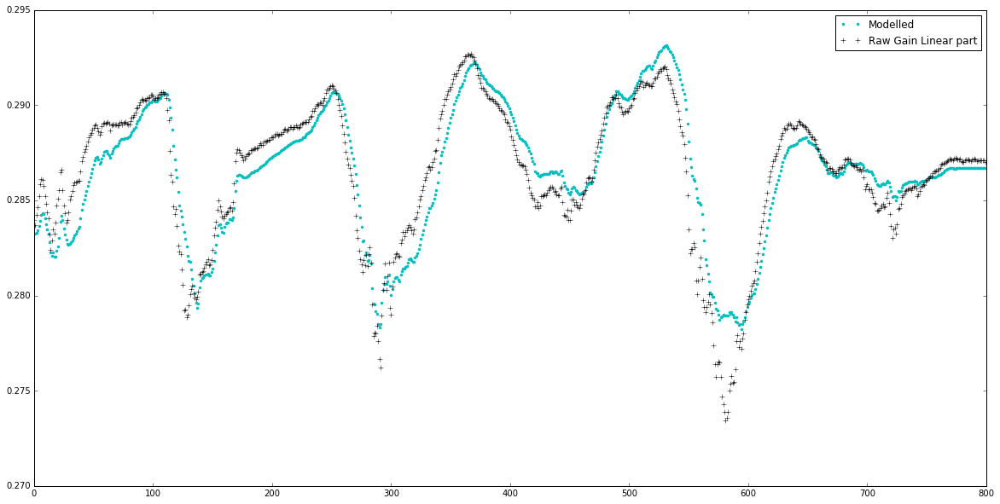

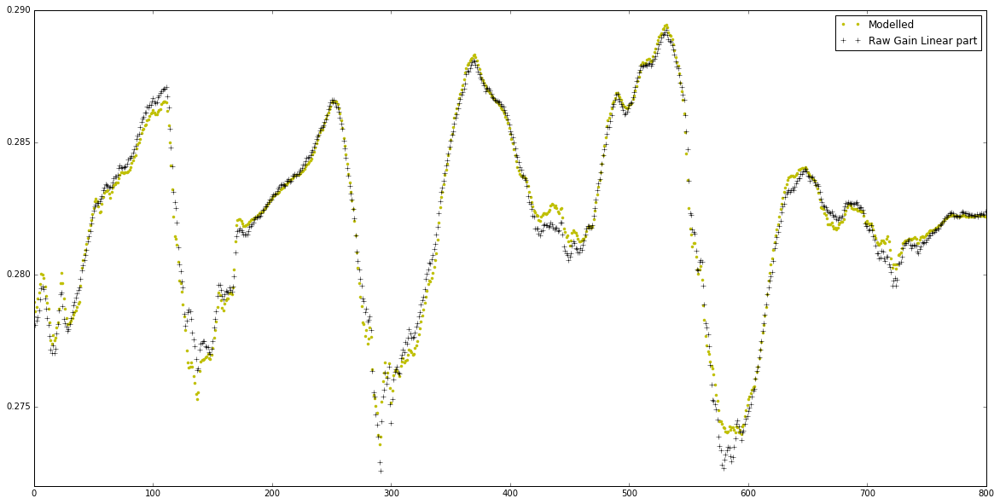

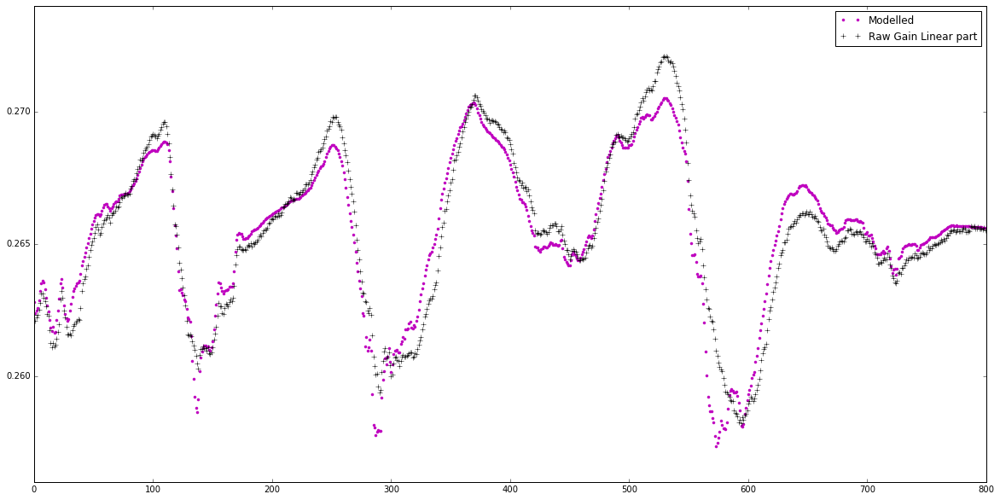

In [234]:
for i in range(len(corr_list)):
    plt.figure(i+1)
    
    plt.plot((gain_reflection_model_600[i] + gain_linear_model_600[i]), '.', color=colors[i], label='Modelled')
    plt.plot(gain_reflection_raw[i] + gain_linear_raw_600[i], '+k', label='Raw Gain Linear part')
    plt.legend()

In [106]:
def func_reflection(T,a,b):
    return a*T + b 

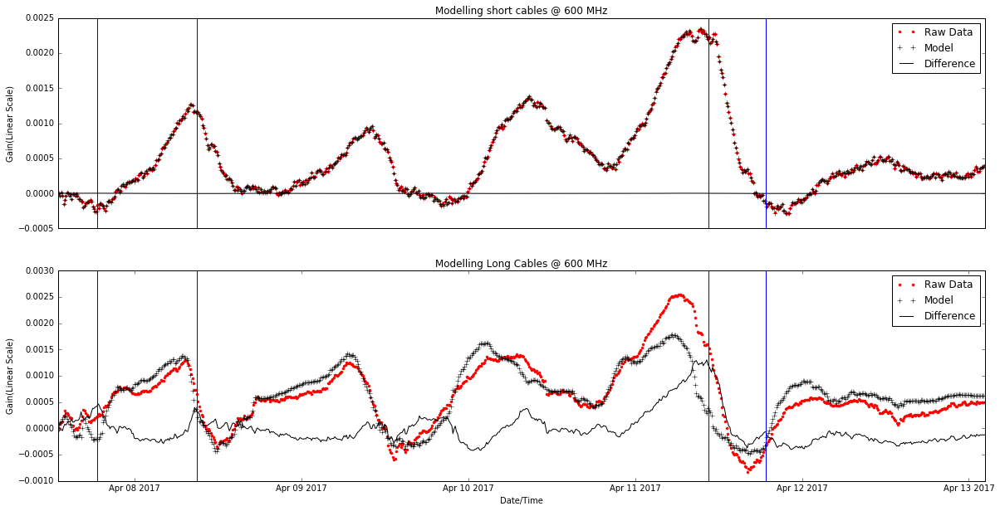

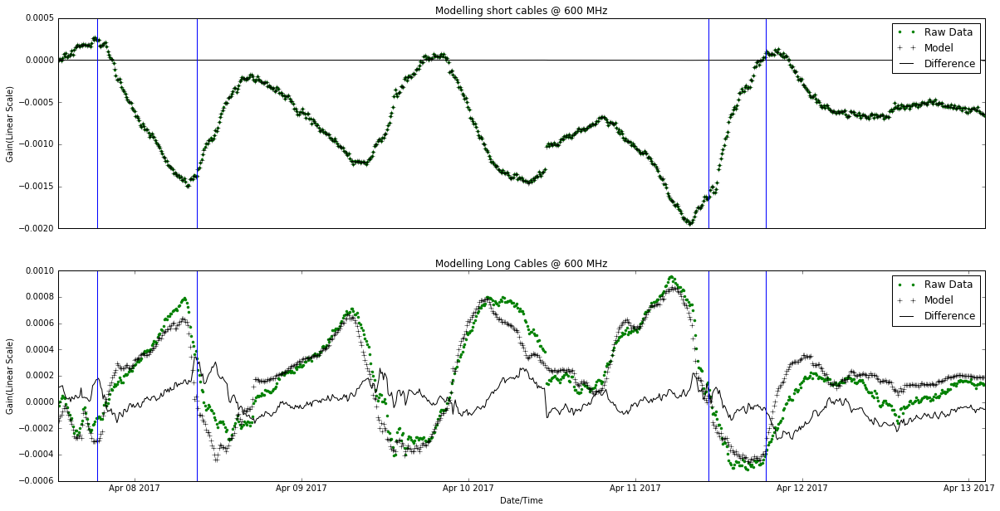

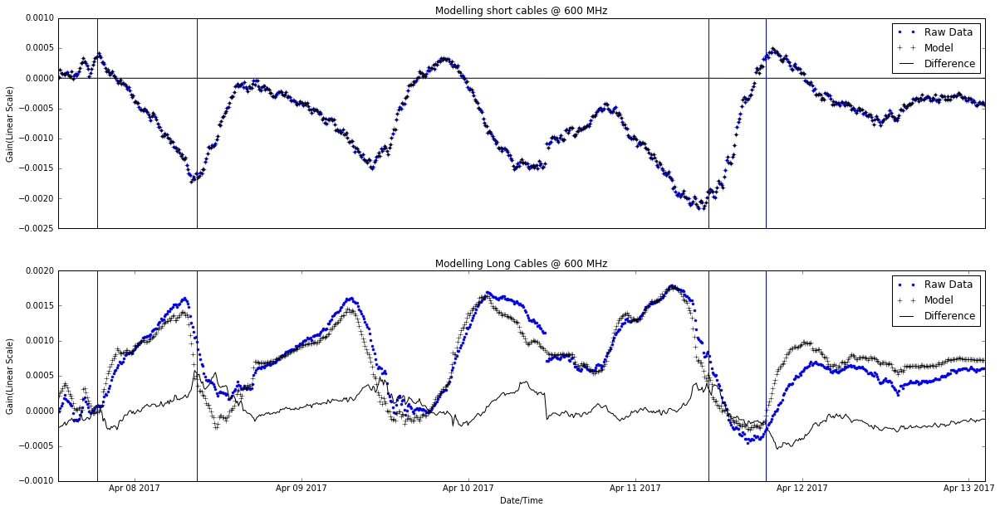

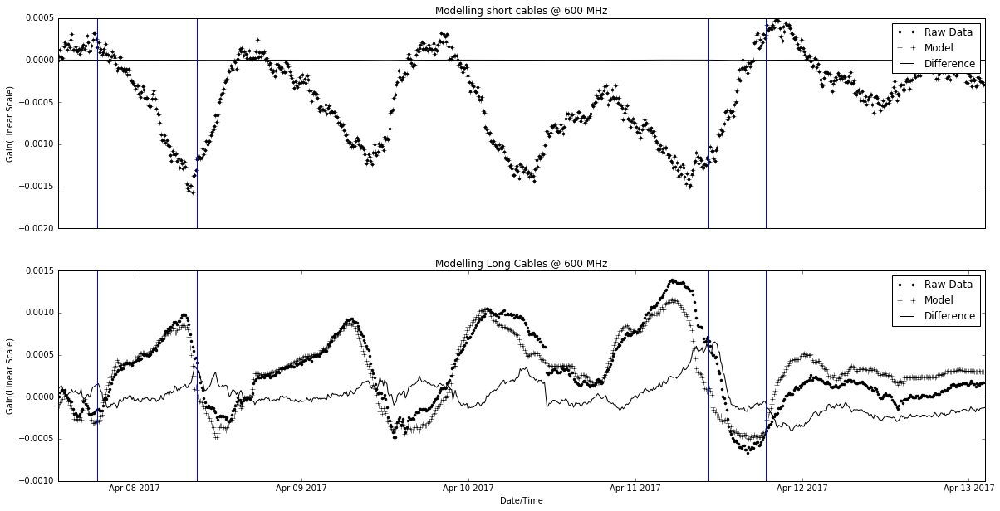

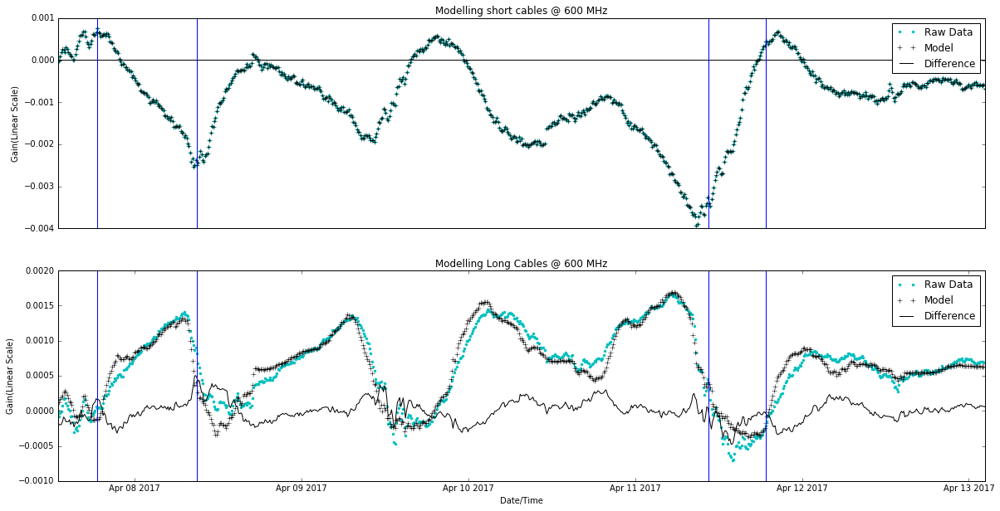

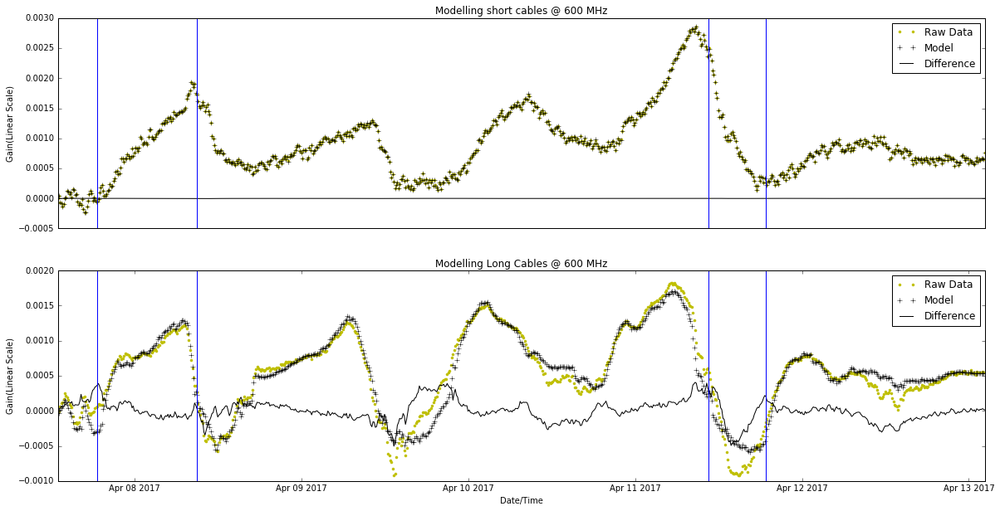

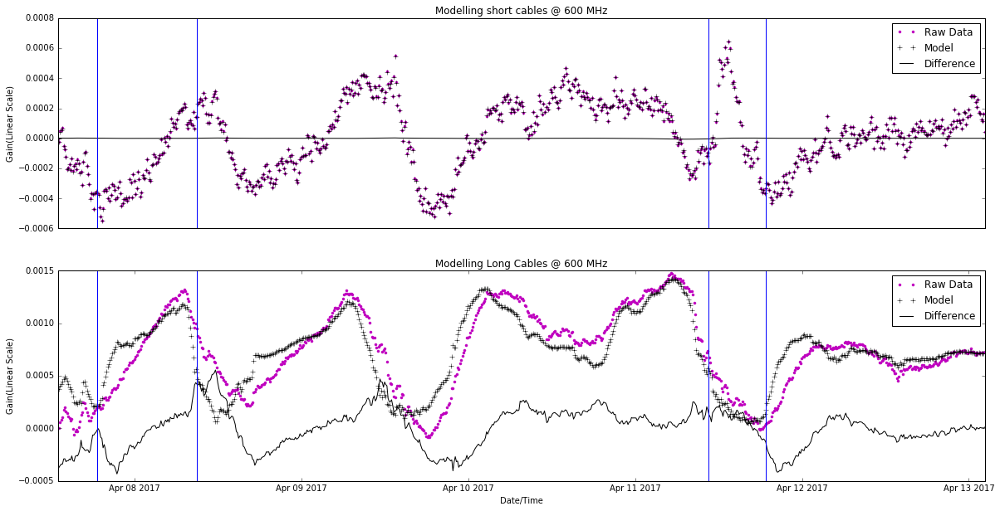

In [241]:
# Modelling short and long reflections @ 600MHz
size =800
gain_reflection_short_cable_model_600=[]
gain_reflection_long_cable_model_600=[]
short_reflection_parameters=[]
long_reflection_parameters =[]

for i in range(len(corr_list)):
    short_reflection_parameters.append([])
    long_reflection_parameters.append([])
    gain_reflection_short_cable_model_600.append([])
    gain_reflection_long_cable_model_600.append([])
        
for i in range(len(corr_list)):
    
    freq_selected = [460,461,462,463,464]
    temp_short_cables = np.zeros(size)
    for kk in range(len(freq_selected)):
        temp_short_cables[:] = temp_short_cables[:] + value_all_600[i][:,freq_selected[kk]]+2
    
    gain_reflection_short_cable_model_600[i]= np.zeros(size)
    gain_reflection_long_cable_model_600[i]= np.zeros(size)
    
    x0 = [1,1]
    x1=[1,2]
    best_vals_short, covar_short = curve_fit(func_reflection, (temp_short_cables[:]), (value_all_600[i][:,freq]), p0 = x1)
    best_vals_long, covar_long = curve_fit(func_reflection, (temp_intercept_model[0:800]+273),value_all_long_600[i][:,freq] , p0 = x0)
    short_reflection_parameters[i] = best_vals_short
    long_reflection_parameters[i] = best_vals_long
    gain_reflection_short_cable_model_600[i][:] = func_reflection(temp_short_cables[:], short_reflection_parameters[i][0], short_reflection_parameters[i][1])
    gain_reflection_long_cable_model_600[i][:] = func_reflection((temp_intercept_model[0:800]+273), long_reflection_parameters[i][0], long_reflection_parameters[i][1])
    
    plt.figure(i+1)
    
    plt.subplot(2,1,1)
    plt.title('Modelling short cables @ 600 MHz')
    plt.ylabel('Gain(Linear Scale)')
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_short_cable_model_600[i],'+k', label = 'Model')
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq]-gain_reflection_short_cable_model_600[i],'k', label='Difference')
    plt.legend()
    plt.xticks([])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[34])
    
    plt.subplot(2,1,2)
    plt.title('Modelling Long Cables @ 600 MHz')
    plt.ylabel('Gain(Linear Scale)')
    plt.xlabel('Date/Time')
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_long_cable_model_600[i],'+k', label = 'Model')
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq]-gain_reflection_long_cable_model_600[i],'k', label='Difference')
    plt.legend()
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[34])

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


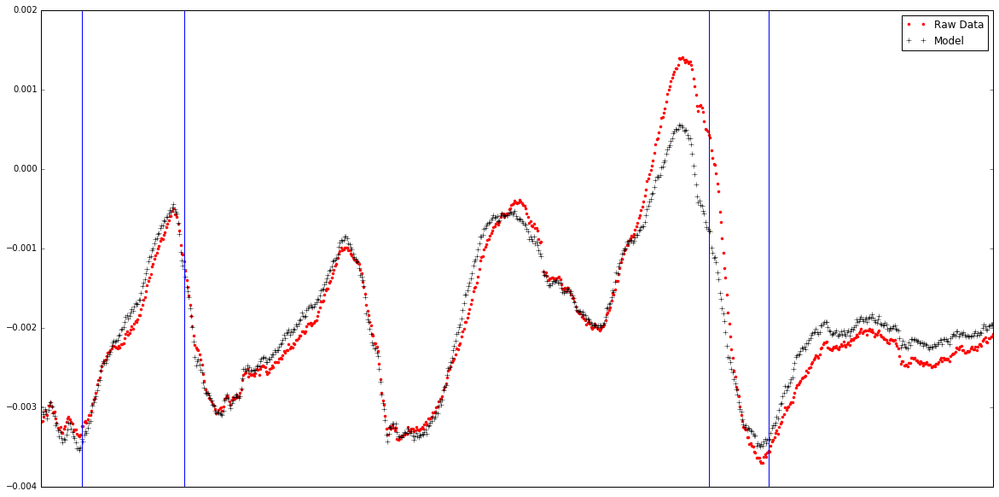

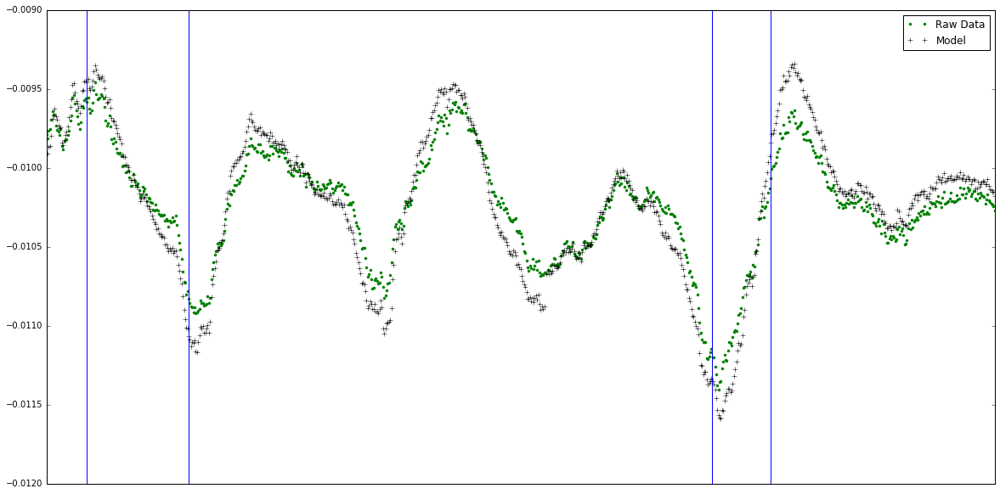

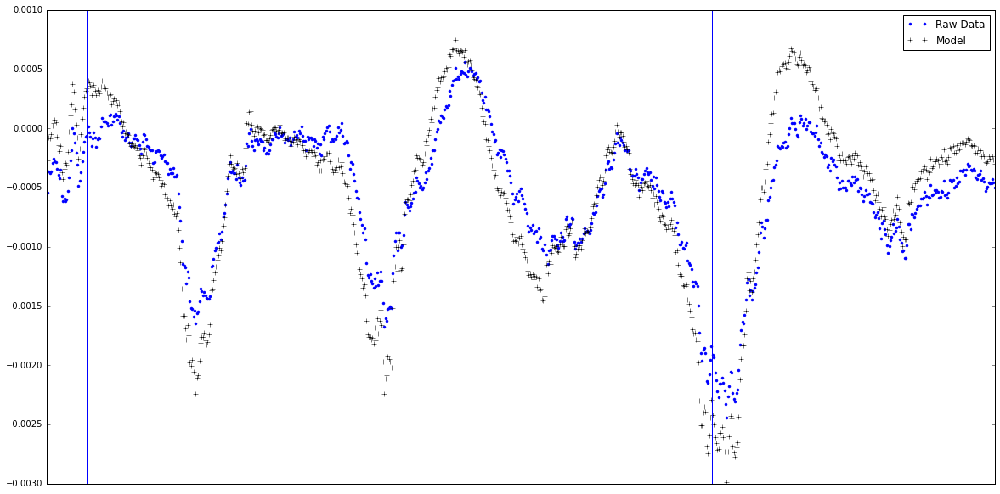

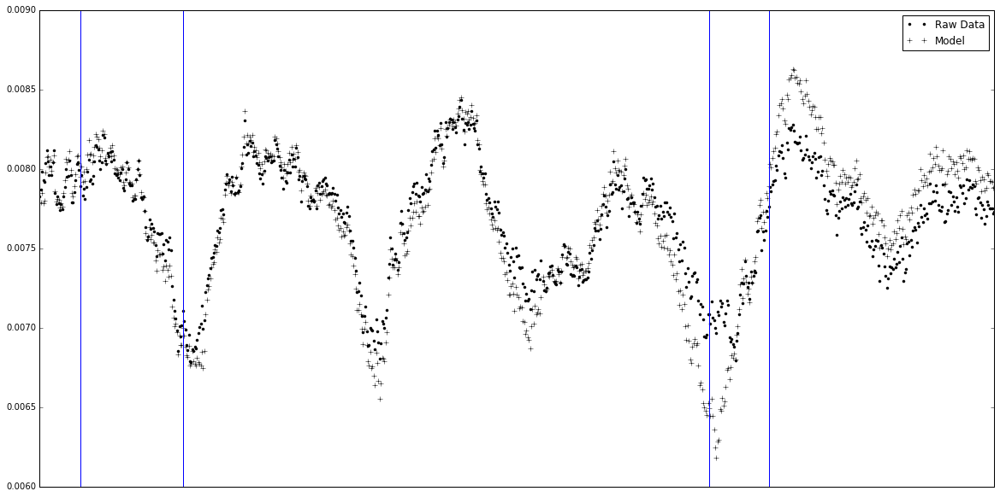

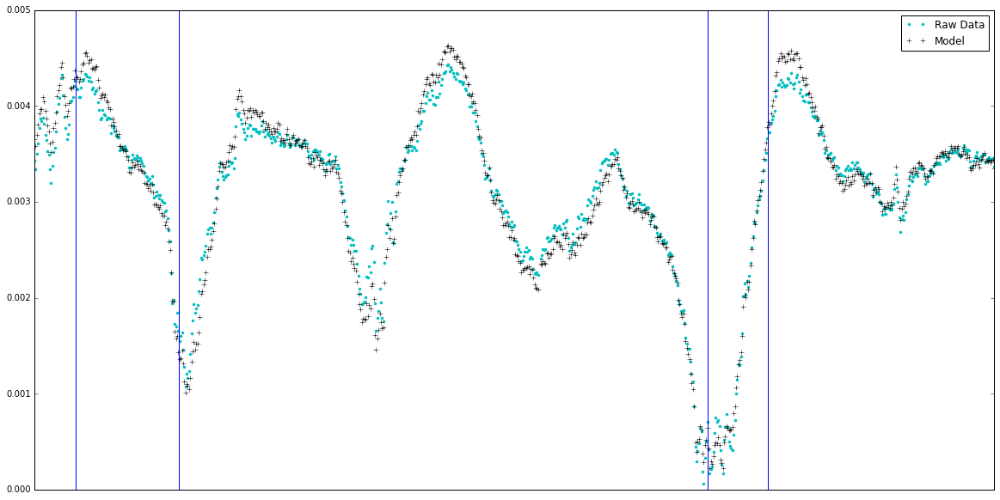

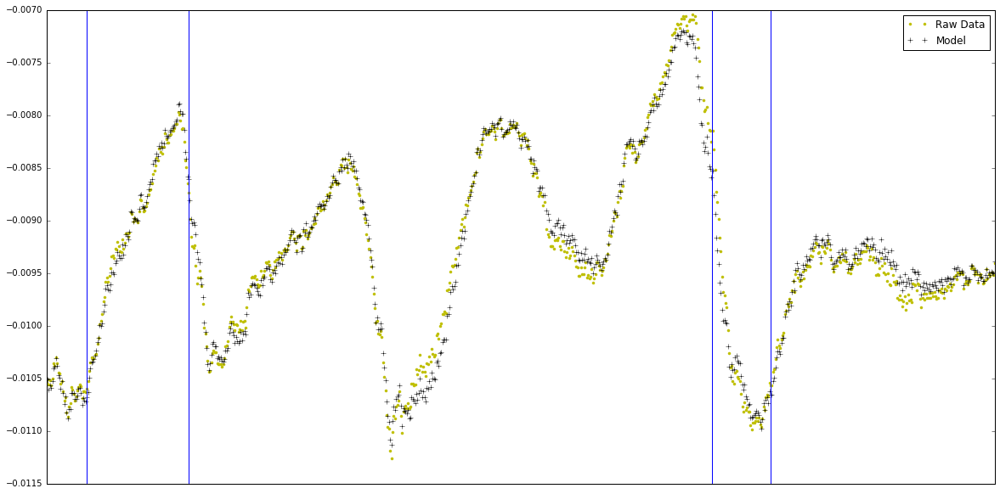

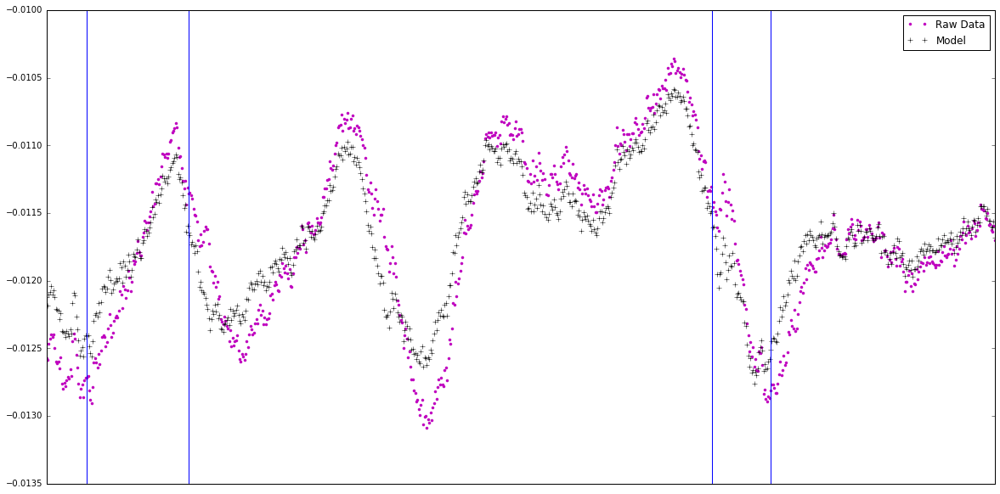

In [214]:
size =800
gain_reflection_short_cable_model_600=[]
gain_reflection_long_cable_model_600=[]
short_reflection_parameters=[]
long_reflection_parameters =[]

for i in range(len(corr_list)):
    short_reflection_parameters.append([])
    long_reflection_parameters.append([])
    gain_reflection_short_cable_model_600.append([])
    gain_reflection_long_cable_model_600.append([])
        
for i in range(len(corr_list)):
    
    freq_selected = [460,461,462,463,464]
    temp_short_cables = np.zeros(size)
    for kk in range(len(freq_selected)):
        temp_short_cables[:] = temp_short_cables[:] + value_all_600[i][:,freq_selected[kk]]+2
    
    gain_reflection_short_cable_model_600[i]= np.zeros(size)
    gain_reflection_long_cable_model_600[i]= np.zeros(size)
    
    x0 = [1,1]
    x1=[1,2]
    best_vals_short, covar_short = curve_fit(func_reflection, (temp_short_cables[:]), value_all_600[i][:,freq], p0 = x1)
    best_vals_long, covar_long = curve_fit(func_reflection, delay[0:800,i],value_all_long_600[i][:,freq] , p0 = x0)
    short_reflection_parameters[i] = best_vals_short
    long_reflection_parameters[i] = best_vals_long
    gain_reflection_short_cable_model_600[i][:] = func_reflection(temp_short_cables[:], short_reflection_parameters[i][0], short_reflection_parameters[i][1])
    gain_reflection_long_cable_model_600[i][:] = func_reflection(delay[0:800,i], long_reflection_parameters[i][0], long_reflection_parameters[i][1])
    
    plt.figure(i+1)

    plt.plot(date_stamp[0:800],value_all_600[i][:,freq]+value_all_long_600[i][:,freq]+reflections_ref_val_600[i] + reflections_ref_long_val_600[i],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_short_cable_model_600[i]+gain_reflection_long_cable_model_600[i]+reflections_ref_val_600[i] + reflections_ref_long_val_600[i],'+k', label = 'Model')
    
    plt.legend()
    plt.xticks([])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[34])
   

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


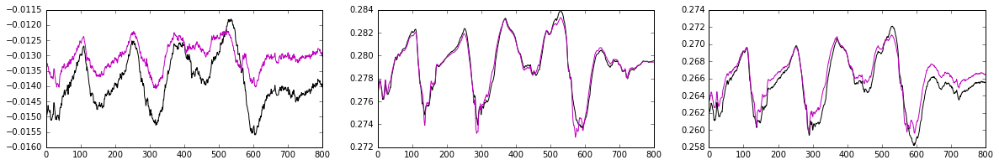

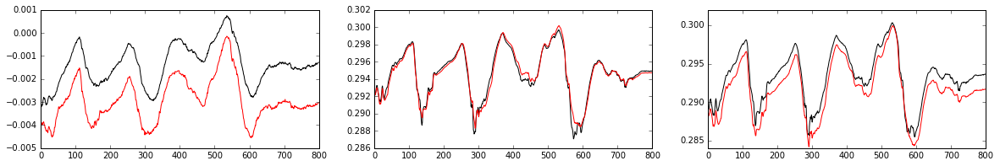

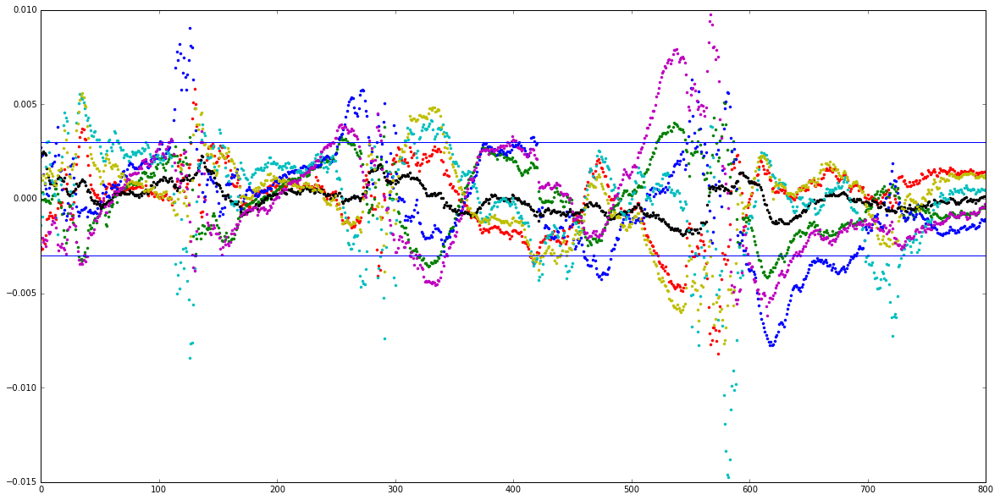

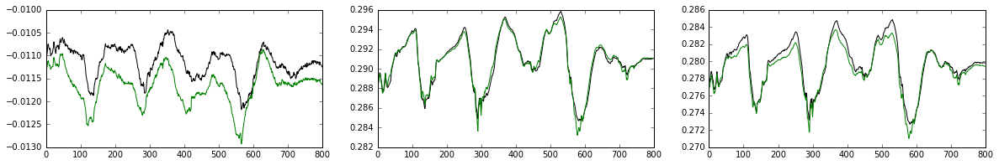

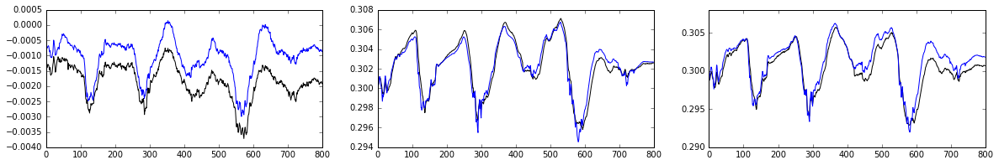

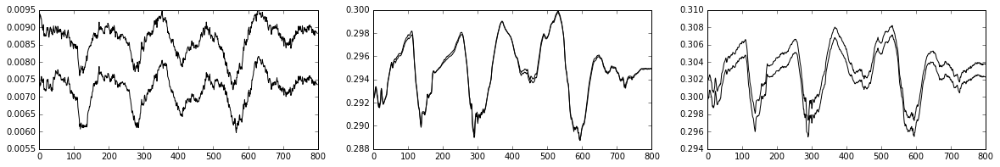

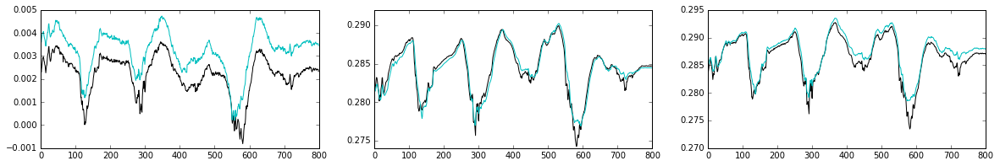

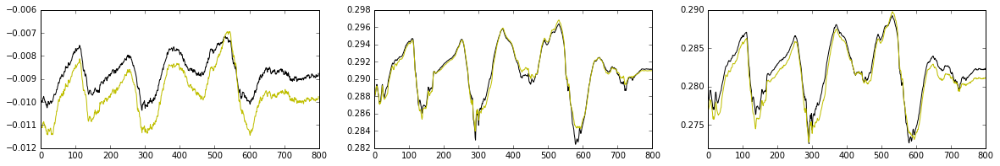

In [280]:
modelled_gain_check=[]

for i in range(len(corr_list)):
    modelled_gain_check.append([])

for i in range(len(corr_list)):
    modelled_gain_check[i] =  gain_reflection_short_cable_model_600[i] +reflections_ref_val_600[i] + reflections_ref_long_val_600[i] + gain_reflection_long_cable_model_600[i]
    
    plt.figure()
    gain_line_sub_600=[]
    gain_line_lin=[]
    
    for kk in range(len(frame_numbers)):
        gain_raw = gain_all[kk,i,:] # for cable 2
        z=np.polyfit(freq_phase[50:990], gain_raw,1)
        p=np.poly1d(z)
        gain_line_sub = gain_raw - p(freq_phase[50:990])
        gain_line_sub_600.append(gain_line_sub[freq])
        gain_line_lin.append(p(freq_phase[50:990])[462])
        
    plt.subplot(3,3,1)    
    plt.plot(gain_line_sub_600,'k')
    plt.plot((modelled_gain_check[i]), color=colors[i])
    
    plt.subplot(3,3,2)
    plt.plot(gain_line_lin,'k')
    plt.plot(gain_linear_model_600[i], color=colors[i])
    
    plt.subplot(3,3,3)    
    plt.plot(array(gain_line_sub_600)+array(gain_line_lin),'k')
    plt.plot(array(modelled_gain_check[i])+array(gain_linear_model_600[i]), color=colors[i])
    
    plt.figure(10)
    mode_gain = array(gain_line_sub_600)+array(gain_line_lin)
    raw_gain_again = array(modelled_gain_check[i])+array(gain_linear_model_600[i])
    #print(len(mode_gain))
    #print(len(raw_gain_again))
    plt.plot((mode_gain-np.mean(mode_gain))/np.mean(mode_gain)-(raw_gain_again-np.mean(raw_gain_again))/np.mean(raw_gain_again),'.', color=colors[i])
    plt.axhline(y=-0.003)
    plt.axhline(y=0.003)

In [276]:
len((mode_gain-np.mean(mode_gain))/np.mean(mode_gain))

800

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


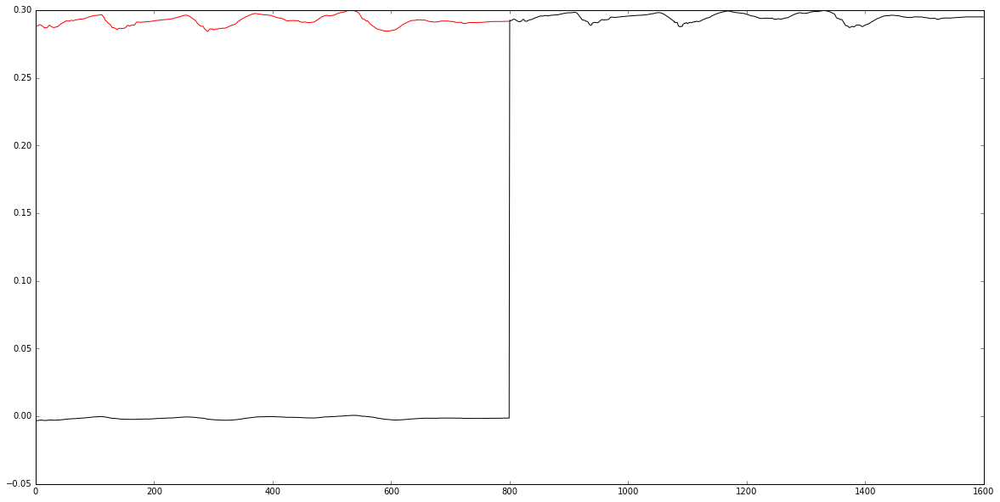

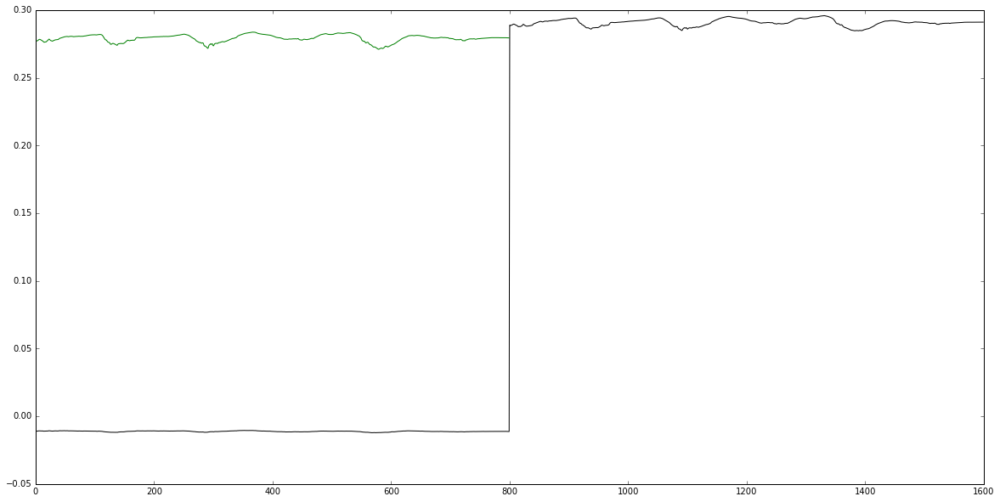

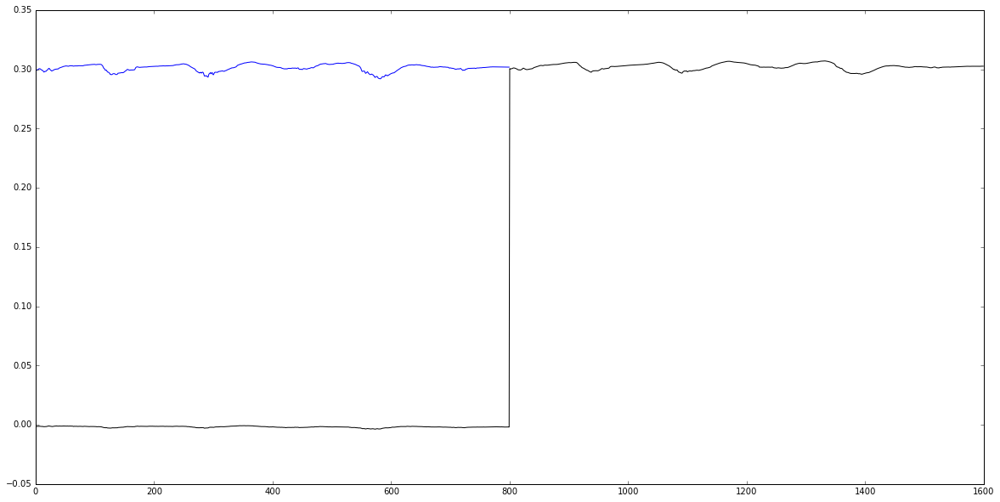

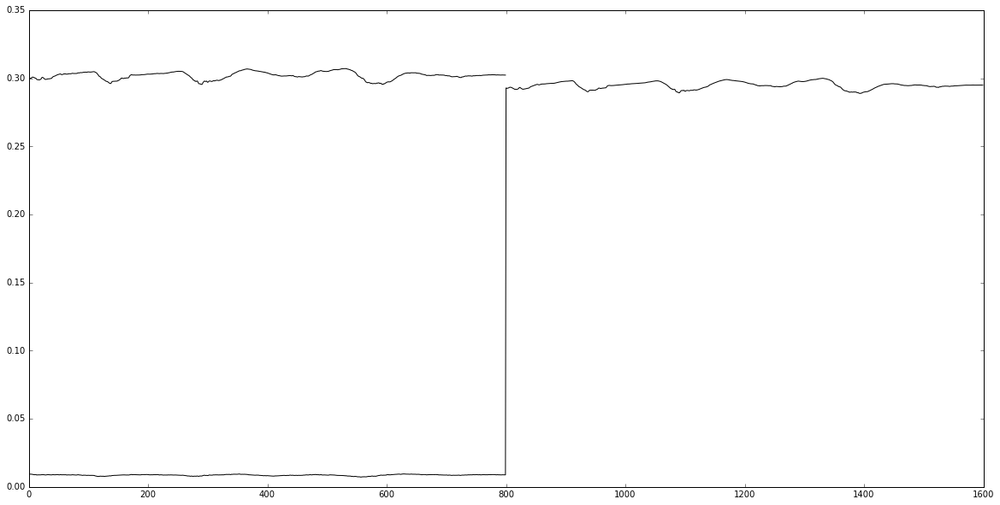

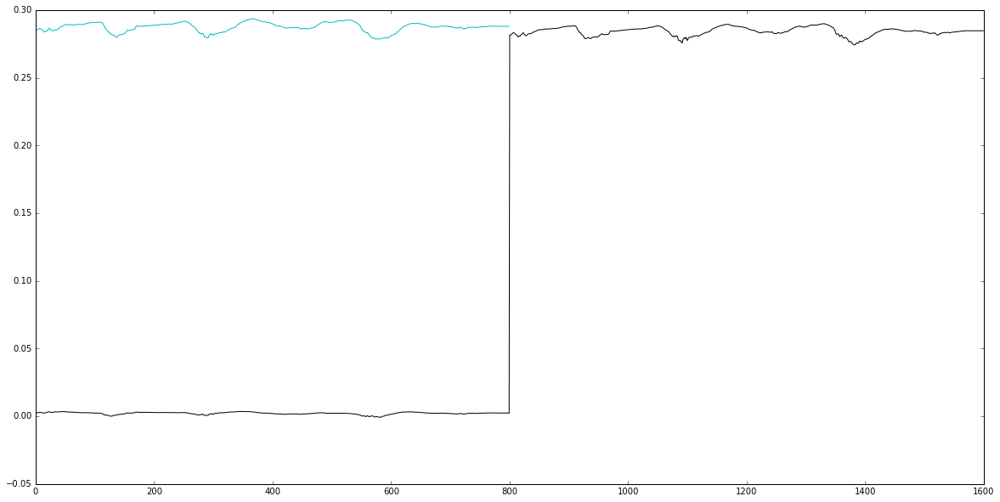

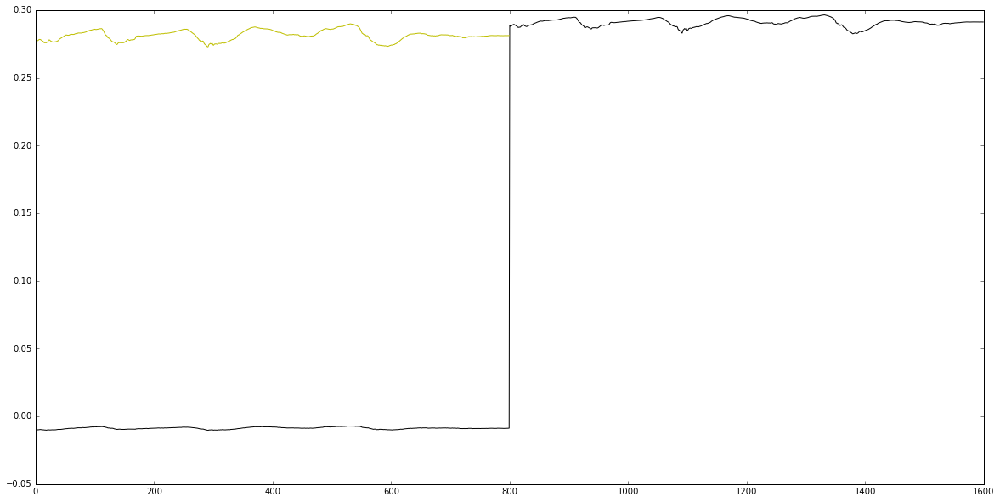

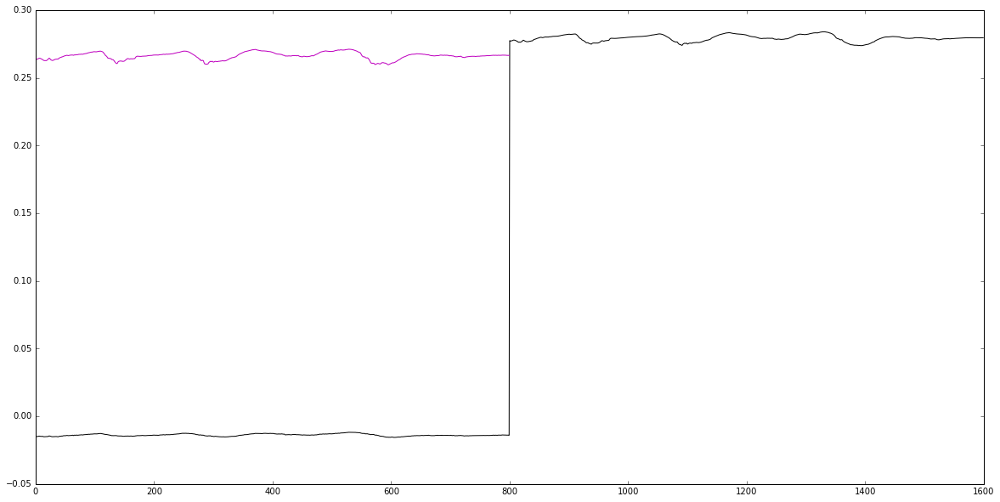

In [260]:
modelled_gain_check=[]

for i in range(len(corr_list)):
    modelled_gain_check.append([])

for i in range(len(corr_list)):
    modelled_gain_check[i] =  gain_reflection_short_cable_model_600[i] +reflections_ref_val_600[i] + reflections_ref_long_val_600[i] + gain_reflection_long_cable_model_600[i]
    
    plt.figure()
    gain_line_sub_600=[]
    gain_line_lin=[]
    
    for kk in range(len(frame_numbers)):
        gain_raw = gain_all[kk,i,:] # for cable 2
        z=np.polyfit(freq_phase[50:990], gain_raw,1)
        p=np.poly1d(z)
        gain_line_sub = gain_raw - p(freq_phase[50:990])
        gain_line_sub_600.append(gain_line_sub[freq])
        gain_line_lin.append(p(freq_phase[50:990])[462])
        
       
    plt.plot(gain_line_sub_600+gain_line_lin,'k')
    plt.plot((modelled_gain_check[i]+gain_linear_model_600[i]), color=colors[i])
    


C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


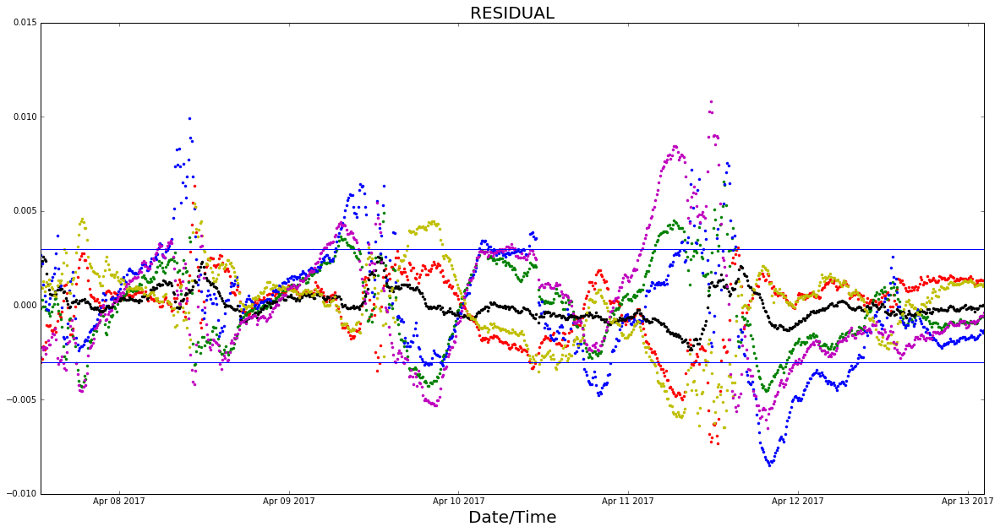

In [223]:
modelled_gain=[]
for i in range(len(corr_list)):
    modelled_gain.append([])
    
for i in range(len(corr_list)):
    modelled_gain[i] = gain_linear_model_600[i] + gain_reflection_short_cable_model_600[i] +reflections_ref_val_600[i] + reflections_ref_long_val_600[i] + gain_reflection_long_cable_model_600[i]

for i in range(len(corr_list)):
    if i!=4:
        frac_change_gain_raw = (gain_all[0:800,i,freq]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
        frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
        plt.figure(1)
        plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i])
        plt.title('RESIDUAL', size=20)
        plt.xlabel('Date/Time', size=20)
        #plt.ylabel('$Gain_raw$ - $Gain_model$', size=20)
        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
#plt.plot(time_intercept_model[0:800],(temp_intercept_model[0:size])/2000,'k',linewidth =4)
#plt.axvline(x=time_intercept_model[120])
#plt.axvline(x=time_intercept_model[580+30])
#plt.axvline(x=time_intercept_model[580-20])
#plt.axvline(x=time_intercept_model[34])


In [171]:
len(gain_reflection_short_cable_model_600[i])

800

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


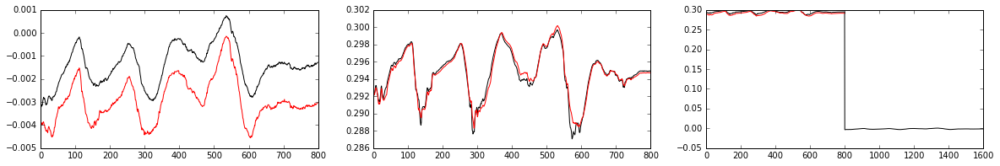

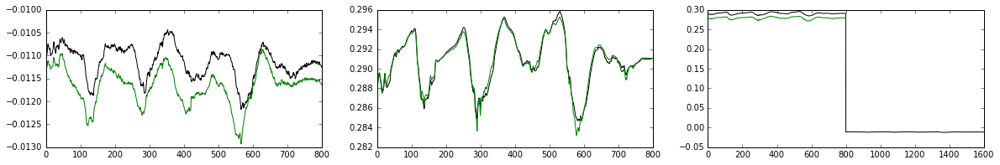

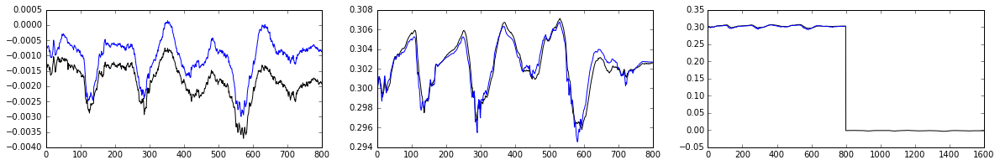

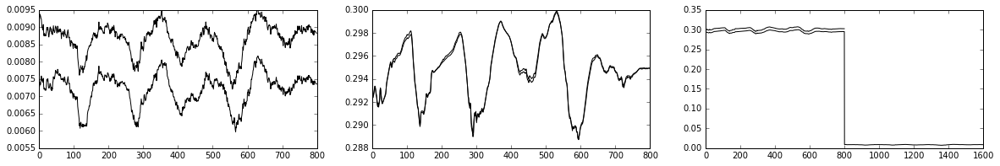

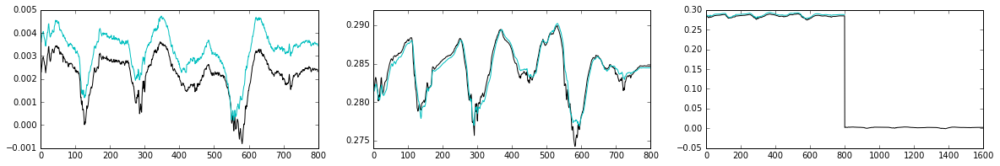

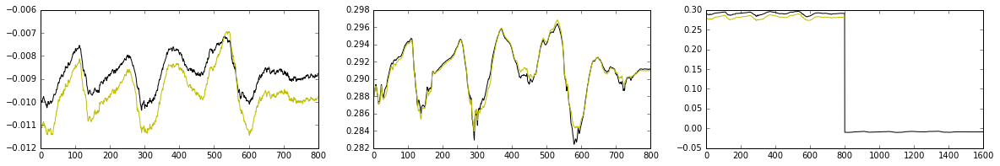

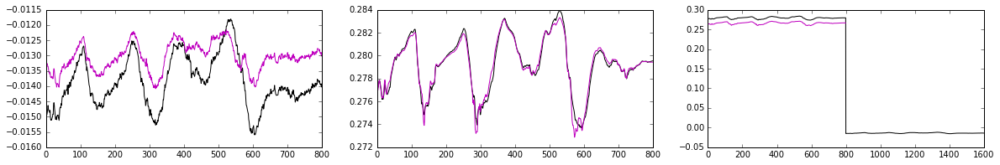

In [258]:
modelled_gain_check=[]

for i in range(len(corr_list)):
    modelled_gain_check.append([])

for i in range(len(corr_list)):
    modelled_gain_check[i] =  gain_reflection_short_cable_model_600[i] +reflections_ref_val_600[i] + reflections_ref_long_val_600[i] + gain_reflection_long_cable_model_600[i]
    
    plt.figure()
    gain_line_sub_600=[]
    gain_line_lin=[]
    
    for kk in range(len(frame_numbers)):
        gain_raw = gain_all[kk,i,:] # for cable 2
        z=np.polyfit(freq_phase[50:990], gain_raw,1)
        p=np.poly1d(z)
        gain_line_sub = gain_raw - p(freq_phase[50:990])
        gain_line_sub_600.append(gain_line_sub[freq])
        gain_line_lin.append(p(freq_phase[50:990])[462])
        
    plt.subplot(3,3,1)    
    plt.plot(gain_line_sub_600,'k')
    plt.plot((modelled_gain_check[i]), color=colors[i])
    
    plt.subplot(3,3,2)
    plt.plot(gain_line_lin,'k')
    plt.plot(gain_linear_model_600[i], color=colors[i])
    
    plt.subplot(3,3,3)
    plt.plot(gain_line_lin[0:800]+gain_line_sub_600[0:800],'k')
    plt.plot(gain_linear_model_600[i]+modelled_gain_check[i], color=colors[i])
    #plt.xlim(0,800)

In [257]:
print (len(gain_line_lin))
print (len(gain_line_sub_600))
print (len(gain_linear_model_600[i]))

800
800
800


C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


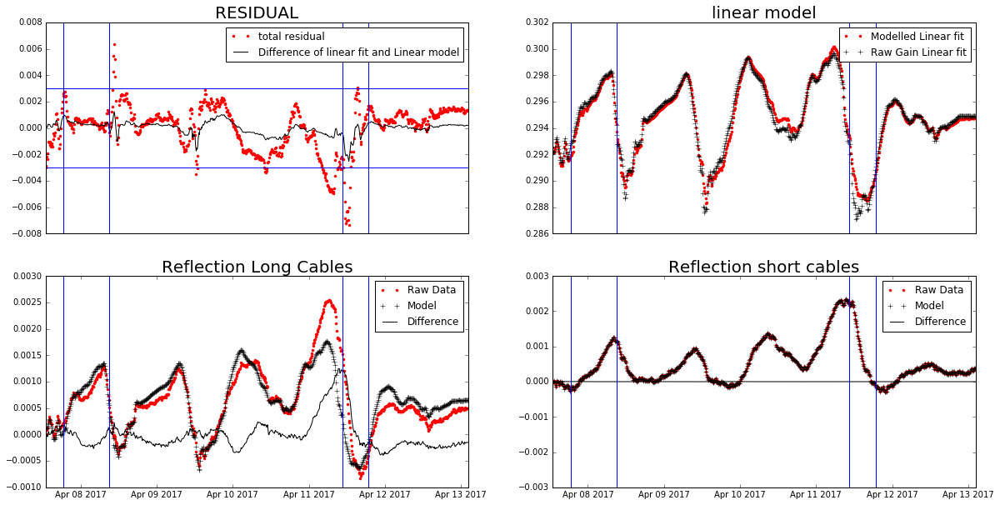

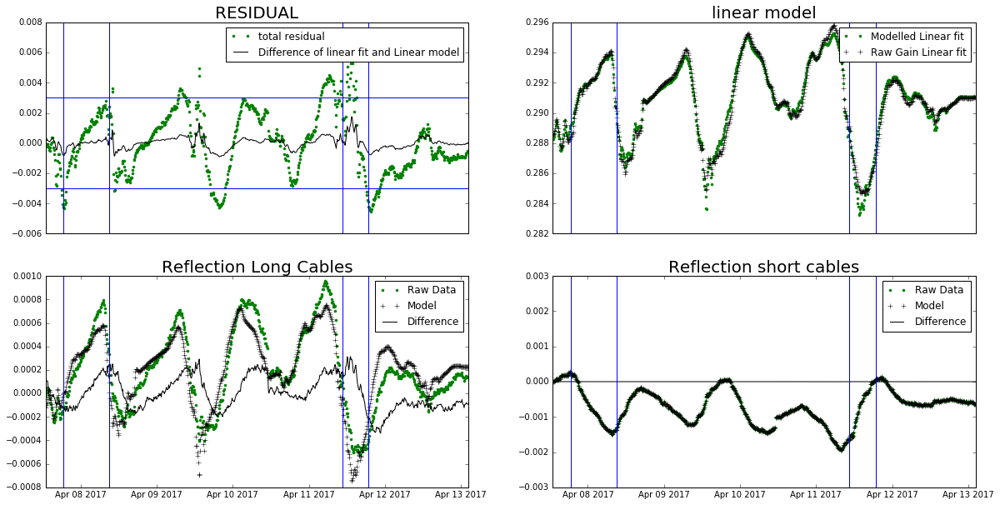

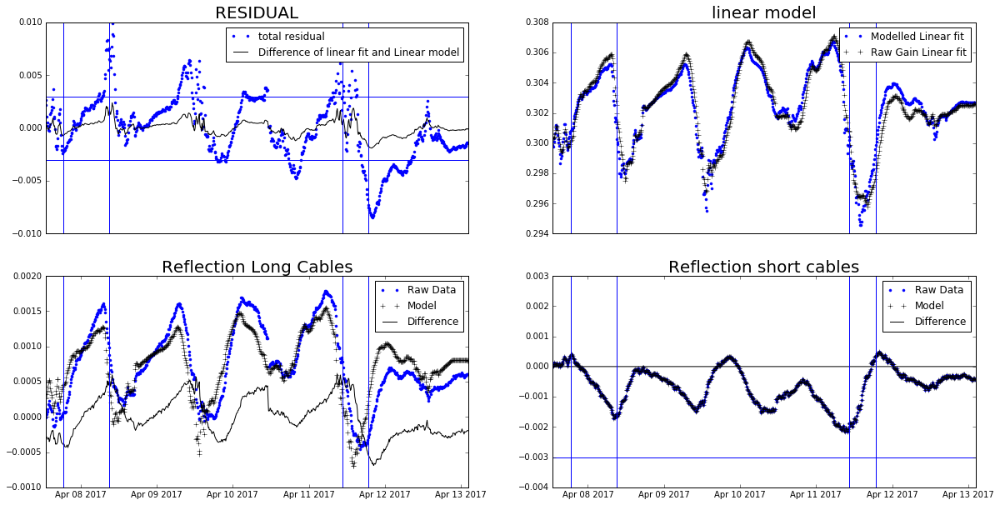

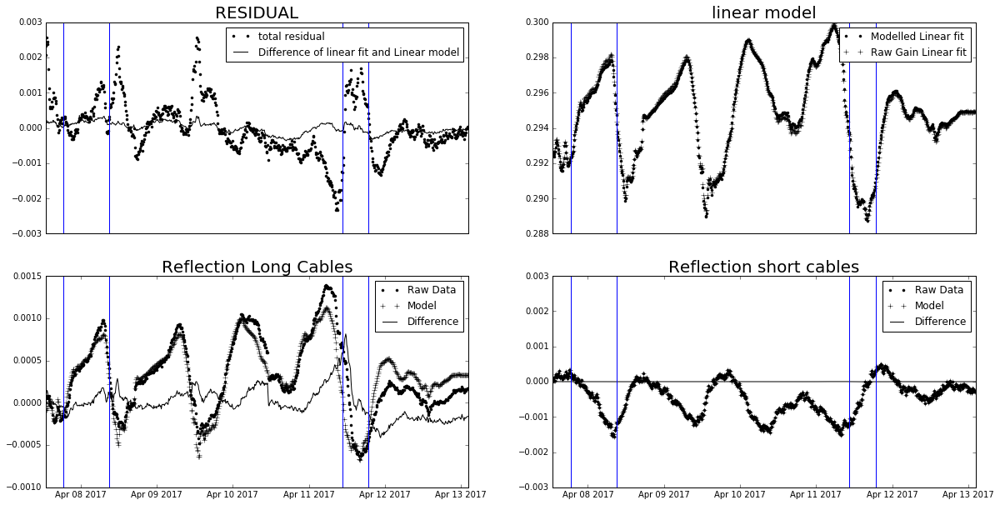

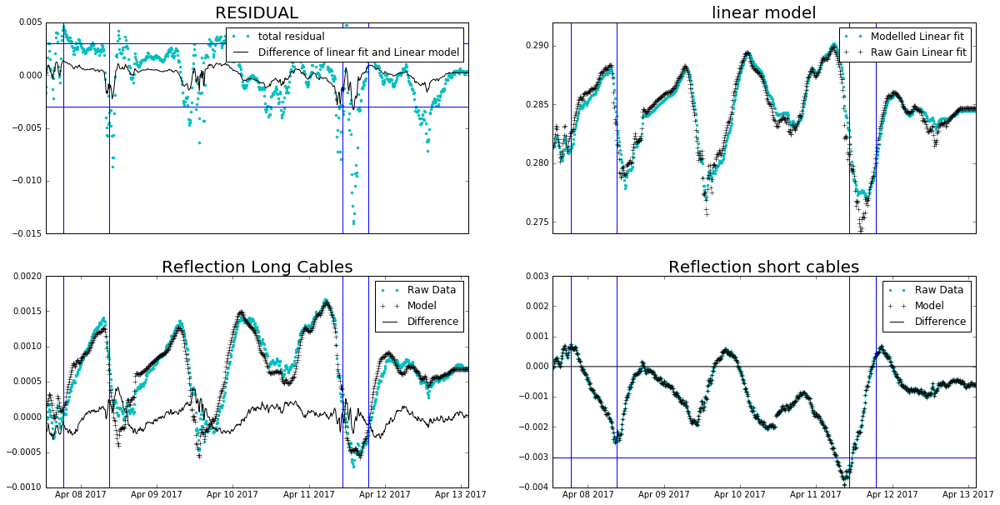

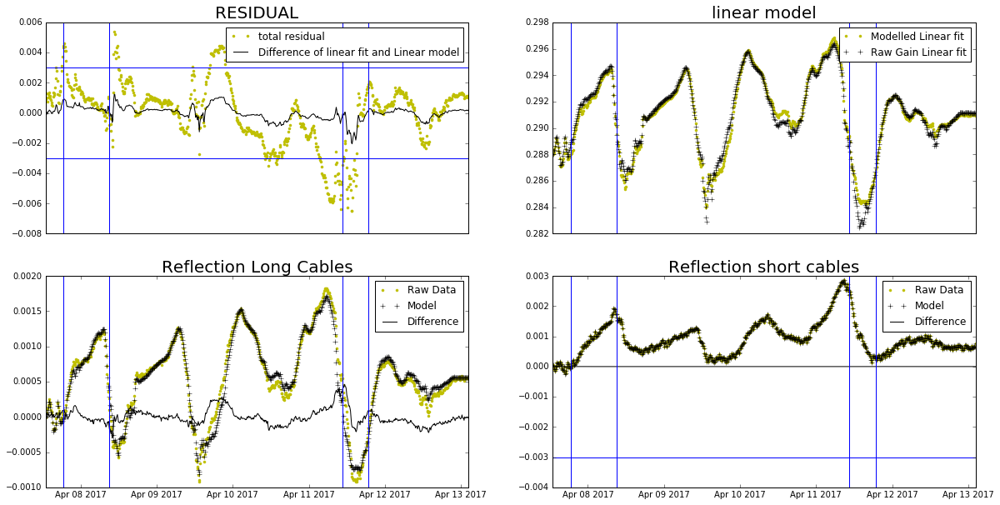

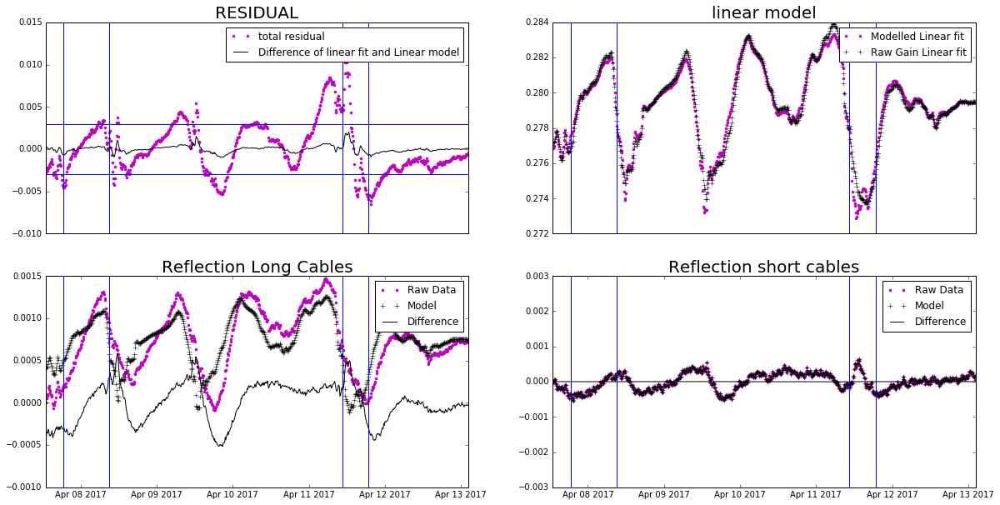

In [225]:
# based on the new model where we have proxy for temperature for short cables
for i in range(len(corr_list)):
    frac_change_gain_raw = (gain_all[0:800,i,freq]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
    frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
    plt.figure(i+1)
    
    plt.subplot(2,2,1)
    plt.title('RESIDUAL', size=20)
    plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i], label = 'total residual')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i] - gain_linear_model_600[i],'k', label='Difference of linear fit and Linear model')
    plt.legend()
    plt.axhline(y=-0.003)
    plt.axhline(y=0.003)
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.xticks([])
    
    plt.subplot(2,2,2)
    plt.title("linear model", size=20)
    plt.plot(date_stamp[0:800],gain_linear_model_600[i], '.', color=colors[i], label='Modelled Linear fit')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i], '+k', label='Raw Gain Linear fit')
    plt.xticks([])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.legend()
    
    plt.subplot(2,2,3)
    plt.title('Reflection Long Cables', size=20)
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_long_cable_model_600[i],'+k', label = 'Model')
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq]-gain_reflection_long_cable_model_600[i],'k', label='Difference')
    plt.legend()
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    
    plt.subplot(2,2,4)
    plt.title('Reflection short cables', size=20)
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_short_cable_model_600[i],'+k', label = 'Model')
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq]-gain_reflection_short_cable_model_600[i],'k', label='Difference')
    plt.legend()
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    
    
    #plt.ylabel('$Gain_raw$ - $Gain_model$', size=20)
    plt.axhline(y=-0.003)
    plt.axhline(y=0.003)


In [ ]:
for i in range(len(corr_list)):
    plt.figure(i+1)
    plt.plot(delay[0:800,i], color=colors[i])
    plt.plot()

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


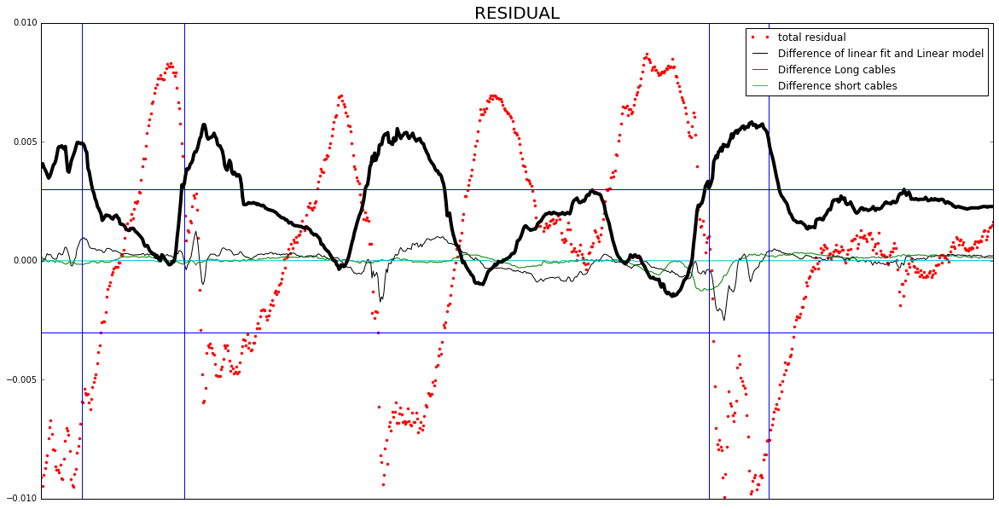

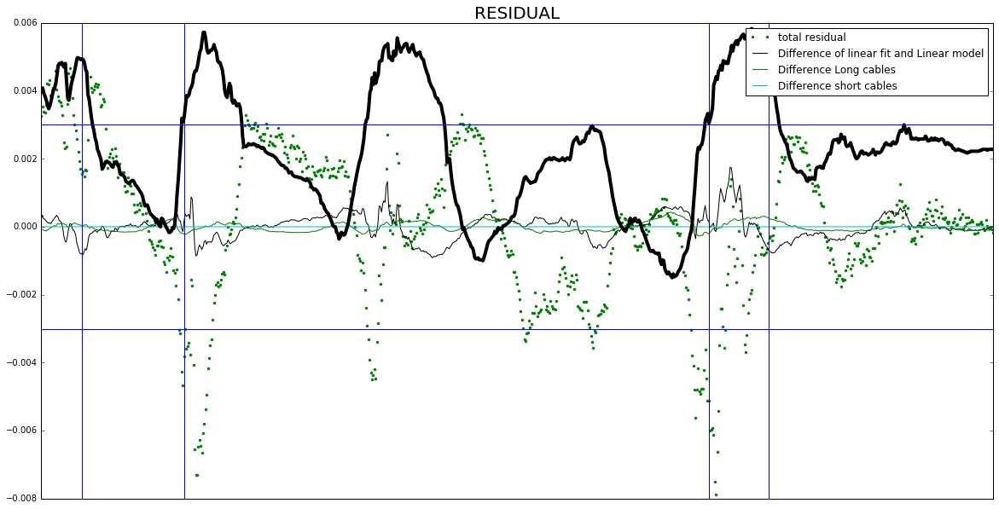

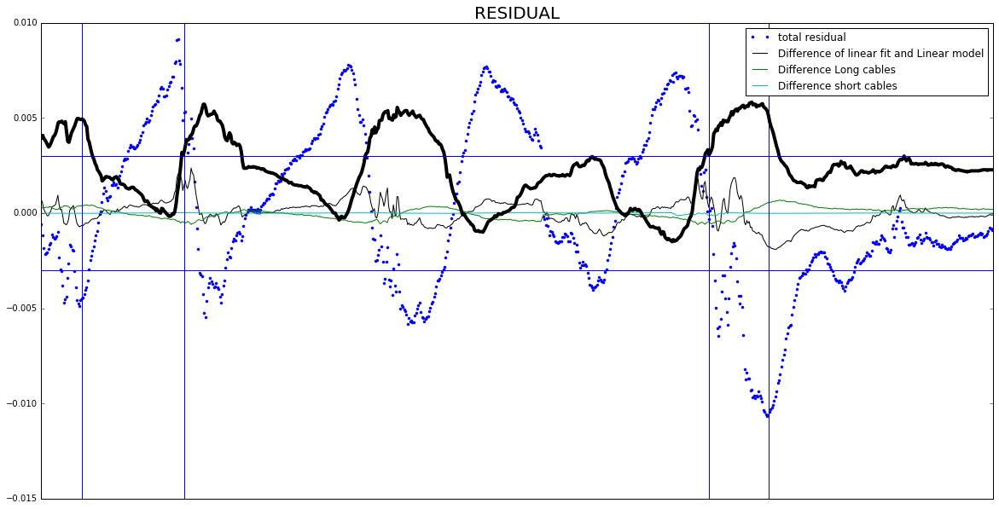

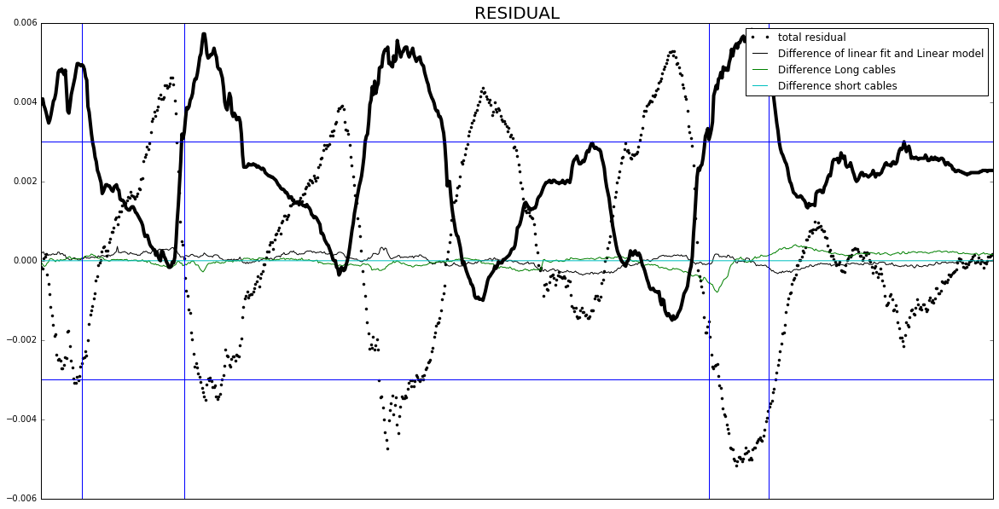

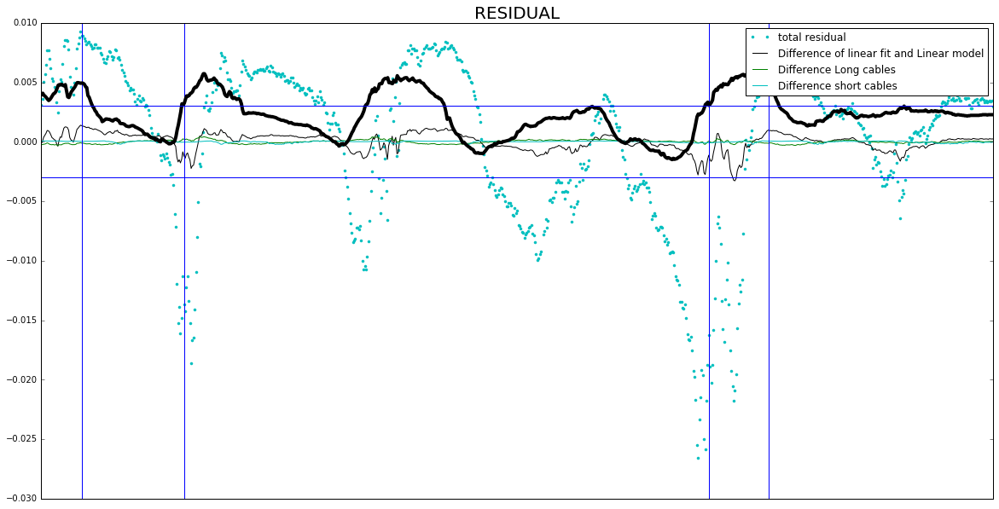

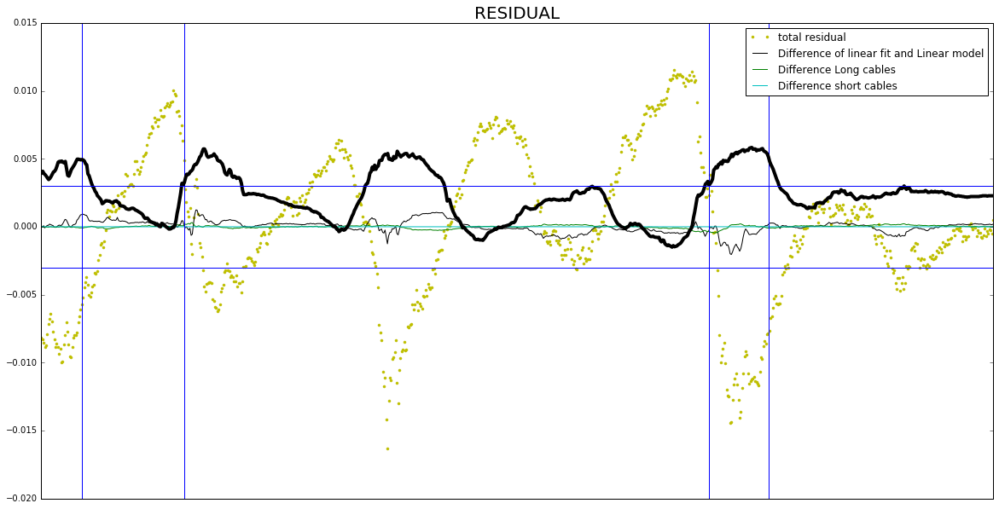

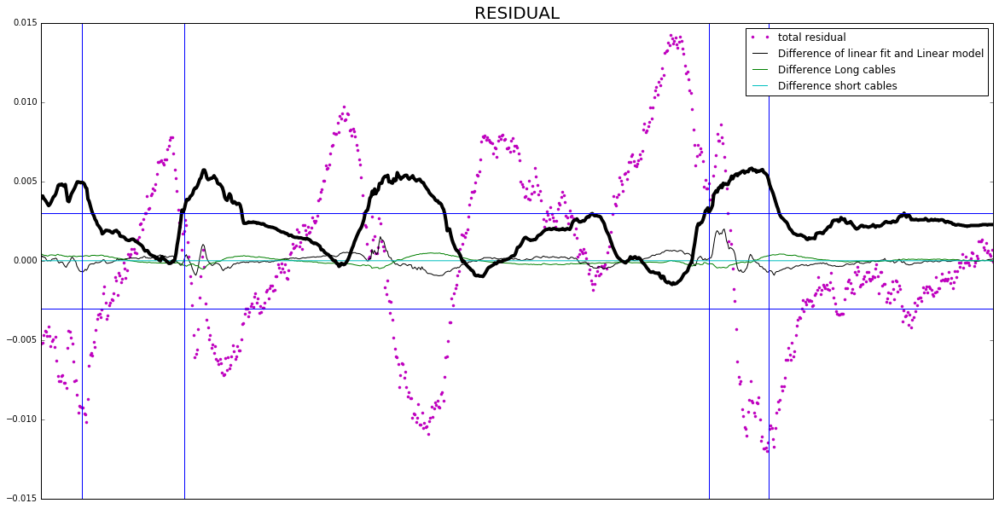

In [181]:
for i in range(len(corr_list)):
    frac_change_gain_raw = (delay[0:800,i]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
    frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
    plt.figure(i+1)
    
    plt.title('RESIDUAL', size=20)
    #plt.subplot(2,1,1)
    plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i], label = 'total residual')
    
    plt.legend()
    plt.axhline(y=-0.003)
    plt.axhline(y=0.003)
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.xticks([])
    
    #plt.subplot(2,1,2)
    #plt.title("linear model", size=20)
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i] - gain_linear_model_600[i],'k', label='Difference of linear fit and Linear model')
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq]-gain_reflection_long_cable_model_600[i],'g', label='Difference Long cables')
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq]-gain_reflection_short_cable_model_600[i],'c', label='Difference short cables')
    plt.legend()
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.plot(time_intercept_model[0:800],(temp_intercept_model[0:size])/2000,'k',linewidth =4)
    #plt.ylabel('$Gain_raw$ - $Gain_model$', size=20)
    plt.axhline(y=-0.003)
    plt.axhline(y=0.003)

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


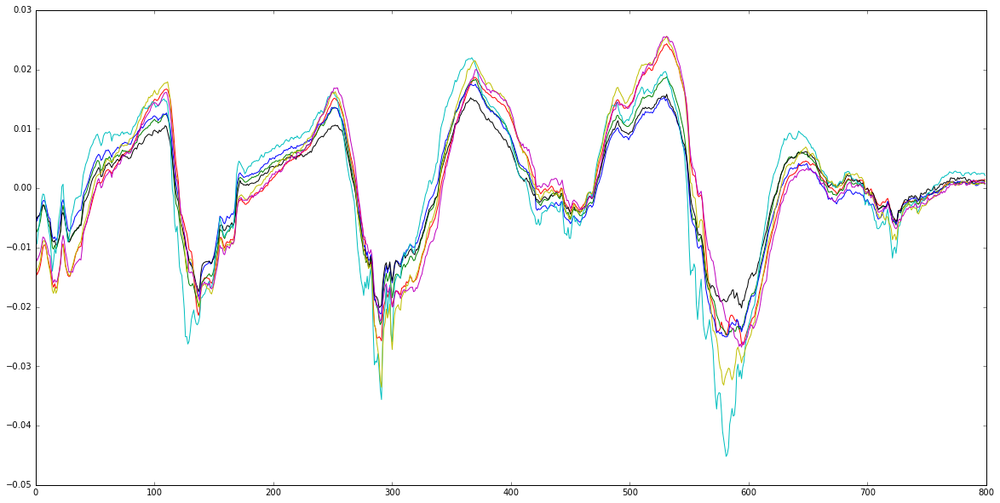

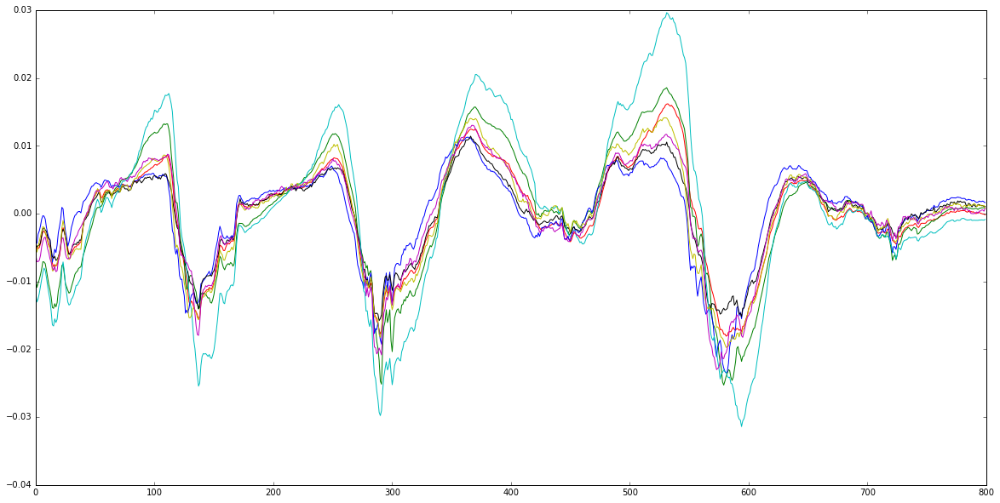

In [183]:
for i in range(len(corr_list)):
    frac_change_gain_raw = (gain_all[0:800,i,freq]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
    frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
    plt.figure(1)
    plt.plot(frac_change_gain_raw, color=colors[i])
    plt.figure(2)
    plt.plot(frac_change_gain_model, color=colors[i])